# Yes Bank Datathon Challenge

The solution code is divided into the following sections:

* Data understanding
* Preprocessing
* EDA
* Handle missing values
* Model 1 - Bonds_aaa Cluster Classification
    * Feature Selection and Dimensionality Reduction using PCA
    * Baseline Model building
    * Cross Validation and Hyperparameter tuning
    * Model Evaluation
    * Model Selection
    * Ensemble Model Building
* Model 2 - Bonds_aaa Prediction
    * Feature Selection using XGBRegressor
    * Baseline Model building
    * Hyperparameter tuning with Cross Validation
    * Model Evaluation
    * Prediction on Final Test data
    * Prepate the Submission file

The complete solution can be accessed from [here](Yes_Bank_Datathon-Final_Submission.ipynb)

# Load libraries

* Let us start with loading the required libraries. 
* Also initialise the RANDOM_STATE global constant to use in the following sections. 

In [176]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns

from collections import Counter
import datetime as dt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.decomposition import PCA

# Classification problem
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier

# Classification evaluation
from sklearn.metrics import confusion_matrix, accuracy_score

# Regression problem
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor

# Regression evaluation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
RANDOM_STATE = 42

# Data Understanding

* Load the train and test dataset files from the data folder. 
* Once we read the data in, print the count of rows and columns in the DataFrames.

In [177]:
train = pd.read_csv('data/Yes_Bank_Train.csv')
test = pd.read_csv('data/Yes_Bank_Test_Data.csv')
print(train.shape)
print(test.shape)

(17773, 56)
(7621, 48)


Now, we we'll check for the first few rows of training and test data set to understand the data

In [178]:
train.head().T

,0,1,2,3,4
Serial Number,1,2,3,4,5
fund_symbol,AAAAX,AAADX,AAAGX,AAAIX,AAANX
fund_name,Deutsche Real Assets A,Aberdeen Income Builder A,Thrivent Large Cap Growth A,American Century Strat Allc: Agrsv I,Horizon Active Asset Allocation Investor
category,World Allocation,Large Blend,Large Growth,Allocation--70% to 85% Equity,Tactical Allocation
fund_family,Deutsche Asset Management,Aberdeen,Thrivent,American Century Investments,Horizon Investments
investment,Blend,Value,Growth,Growth,Blend
size,Large,Large,Large,Large,Large
total_net_assets,486740000,9980000,997620000,907850000,451260000
currency,USD,USD,USD,USD,USD
net_annual_expenses_ratio,1.22,1.44,1.2,0.91,1.36


In [179]:
test.head().T

,0,1,2,3,4
Serial Number,1,2,3,4,5
fund_symbol,PFCRX,PFDAX,PFDBX,PFDCX,PFDEX
fund_name,Pacific Funds Large-Cap Investor,Pacific Funds Small/Mid-Cap A,RiskPro PFG Balanced 20-30 R,PNC Bond C,RiskPro PFG Equity 30+ R
category,Large Blend,Small Blend,Allocation--50% to 70% Equity,Intermediate-Term Bond,Large Blend
fund_family,Pacific Funds Series Trust,Pacific Funds Series Trust,The Pacific Financial Group,PNC Funds,The Pacific Financial Group
investment,Blend,Growth,Blend,Blend,Blend
size,Large,Medium,Large,Medium,Large
total_net_assets,18170000,257730000,227230000,19650000,312040000
currency,USD,USD,USD,USD,USD
net_annual_expenses,1,1.3,0,1.53,0


There are few columns missing in the test dataset. Let's check for the difference of columns between the training and testing dataset

In [180]:
print(list(set(train.columns).symmetric_difference(set(test.columns))))

['bonds_b', 'net_annual_expenses_ratio', 'bonds_others', 'bonds_below_b', 'bonds_aaa', 'bonds_bbb', 'net_annual_expenses', 'bonds_a', 'bonds_aa', 'bonds_bb']


* Values of bonds_ variables signifies the Basis Point Spread(bps) for various grades of shares.
* These bonds_ variables will be used to form a cluster 
* Then those clusters will be used to predict the **bonds_aaa (target) variable**  
* net_annual_expenses_ratio is present in training but not in test dataset and net_annual_expenses is viceversa. We will need to check these columns. 

We'll check for the types of each column now 

In [181]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17773 entries, 0 to 17772
Data columns (total 56 columns):
Serial Number                     17773 non-null int64
fund_symbol                       17773 non-null object
fund_name                         17773 non-null object
category                          17773 non-null object
fund_family                       17773 non-null object
investment                        16783 non-null object
size                              16783 non-null object
total_net_assets                  17773 non-null int64
currency                          17773 non-null object
net_annual_expenses_ratio         17761 non-null float64
morningstar_rating                17773 non-null int64
inception_date                    17773 non-null object
portfolio_cash                    17768 non-null float64
portfolio_stocks                  17768 non-null float64
portfolio_bonds                   17768 non-null float64
portfolio_others                  17768 non-null f

* Totally 56 columns are there
* 8 object type columns of which 1 is of date type
* 48 columns are of numeric type

# Data Cleaning

Next we'll check for the missing values count in training and testing dataset

In [182]:
train.isnull().sum()

Serial Number                        0
fund_symbol                          0
fund_name                            0
category                             0
fund_family                          0
investment                         990
size                               990
total_net_assets                     0
currency                             0
net_annual_expenses_ratio           12
morningstar_rating                   0
inception_date                       0
portfolio_cash                       5
portfolio_stocks                     5
portfolio_bonds                      5
portfolio_others                     5
portfolio_preferred                  5
portfolio_convertable                5
sectors_basic_materials              5
sectors_consumer_cyclical            5
sectors_financial_services           5
sectors_real_estate                  5
sectors_consumer_defensive           5
sectors_healthcare                   5
sectors_utilities                    5
sectors_communication_ser

In [183]:
test.isnull().sum()

Serial Number                        0
fund_symbol                          0
fund_name                            0
category                             0
fund_family                          0
investment                         560
size                               560
total_net_assets                     0
currency                             0
net_annual_expenses                  4
morningstar_rating                   0
inception_date                       0
portfolio_cash                       3
portfolio_stocks                     3
portfolio_bonds                      3
portfolio_others                     3
portfolio_preferred                  3
portfolio_convertable                3
sectors_basic_materials              3
sectors_consumer_cyclical            3
sectors_financial_services           3
sectors_real_estate                  3
sectors_consumer_defensive           3
sectors_healthcare                   3
sectors_utilities                    3
sectors_communication_ser

### Impute the missing values

In [184]:
#Helper Function to Identify the Mode for a data group to impute the missing values
def mode_in_group(grp):
    try:
        mode_val = grp.value_counts().index[0]
        return(mode_val)
    except IndexError:
        return('value_missing')

In [185]:
#Impute the missing(na) investment with category     
data = [train, test]

for df in data:
    # Replace the missing values with the mode value of that category column 
    df['investment'] = df.groupby(['category'])['investment'].apply(lambda x: x.fillna(mode_in_group(x)))
   
    # Replace the remaining missing values with the mode value of that column 
    df['investment'] = df['investment'].apply(lambda x : x.replace('value_missing', 'Blend'))
    print(df['investment'].value_counts())
    print('\n')

Blend     8328
Growth    4728
Value     4717
Name: investment, dtype: int64


Blend     3788
Value     1927
Growth    1906
Name: investment, dtype: int64




In [186]:
#Impute the missing(na) size with category    
data = [train, test]

for df in data:
    # Replace the missing values with the mode value of that category column 
    df['size'] = df.groupby(['category'])['size'].apply(lambda x: x.fillna(mode_in_group(x)))
    
    # Replace the remaining missing values with the mode value of that column
    df['size'] = df['size'].apply(lambda x : x.replace('value_missing', 'Large'))
    print(df['size'].value_counts())
    print('\n')

Large     10641
Medium     4593
Small      2539
Name: size, dtype: int64


Large     4454
Medium    1990
Small     1177
Name: size, dtype: int64




We'll now check for the net_annual_expense_ratio in training and net_annual_expenses in testing dataset missing values

In [187]:
print('Training - net_annual_expenses_ratio:\n')
print(train['net_annual_expenses_ratio'].describe())
print('\n\nTesting - net_annual_expenses:\n')
print(test['net_annual_expenses'].describe())

Training - net_annual_expenses_ratio:

count    17761.000000
mean         1.022543
std          0.626989
min          0.000000
25%          0.620000
50%          0.960000
75%          1.370000
max         19.100000
Name: net_annual_expenses_ratio, dtype: float64


Testing - net_annual_expenses:

count    7617.000000
mean        0.973303
std         0.645056
min         0.000000
25%         0.510000
50%         0.930000
75%         1.350000
max         7.840000
Name: net_annual_expenses, dtype: float64


Both net_annual_expenses_ratio in training set and net_annual_expenses in testing set are in same range of values. Only the column names are different. So we can very well rename the net_annual_expenses_ratio column in training dataset.

In [188]:
# rename the column net_annual_expenses_ratio
train.rename(columns={'net_annual_expenses_ratio':'net_annual_expenses'}, inplace=True)

In [189]:
# let's view the missing rows
train[np.isnan(train['net_annual_expenses'])]

,Serial Number,fund_symbol,fund_name,category,fund_family,investment,size,total_net_assets,currency,net_annual_expenses,...,returns_2012,returns_2011,returns_2010,morningstar_risk_rating,alpha_3y,beta_3y,mean_annual_return_3y,standard_deviation_3y,sharpe_ratio_3y,treynor_ratio_3y
17529,17530,PDAJX,Prudential Day One Income R6,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17540,17541,PDBJX,Prudential Day One 2010 R6,Target-Date 2000-2010,Prudential Funds (PGIM Investments),Blend,Large,5610000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17549,17550,PDCJX,Prudential Day One 2015 R6,Target-Date 2015,Prudential Funds (PGIM Investments),Blend,Large,820000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17556,17557,PDDJX,Prudential Day One 2020 R6,Target-Date 2020,Prudential Funds (PGIM Investments),Blend,Large,26940000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17564,17565,PDEJX,Prudential Day One 2025 R6,Target-Date 2025,Prudential Funds (PGIM Investments),Blend,Large,30850000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17574,17575,PDFJX,Prudential Day One 2030 R6,Target-Date 2030,Prudential Funds (PGIM Investments),Blend,Large,27640000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17583,17584,PDGJX,Prudential Day One 2035 R6,Target-Date 2035,Prudential Funds (PGIM Investments),Blend,Large,20020000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17592,17593,PDHJX,Prudential Day One 2040 R6,Target-Date 2040,Prudential Funds (PGIM Investments),Blend,Large,19690000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17602,17603,PDIJX,Prudential Day One 2045 R6,Target-Date 2045,Prudential Funds (PGIM Investments),Blend,Large,12310000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17611,17612,PDJJX,Prudential Day One 2050 R6,Target-Date 2050,Prudential Funds (PGIM Investments),Blend,Large,550000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN


We can start to see some patterns in the dataset.

* all the missing rows are related to one particular fund family **Prudential Funds (PGIM Investments)**
* also fund names are all ends with **R6**

Let's view all the rows with the fund family **Prudential Funds (PGIM Investments)** and see if we could observe some more patterns.

In [190]:
train.loc[train['fund_family']=='Prudential Funds (PGIM Investments)']

,Serial Number,fund_symbol,fund_name,category,fund_family,investment,size,total_net_assets,currency,net_annual_expenses,...,returns_2012,returns_2011,returns_2010,morningstar_risk_rating,alpha_3y,beta_3y,mean_annual_return_3y,standard_deviation_3y,sharpe_ratio_3y,treynor_ratio_3y
17523,17524,PDADX,Prudential Day One Income R1,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,0.64,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17524,17525,PDAEX,Prudential Day One Income R2,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,0.39,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17525,17526,PDAFX,Prudential Day One Income R3,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,0.09,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17526,17527,PDAGX,Prudential Day One Income R4,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,0.14,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17527,17528,PDAHX,Prudential Day One Income R5,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,0.03,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17529,17530,PDAJX,Prudential Day One Income R6,Target-Date Retirement,Prudential Funds (PGIM Investments),Blend,Large,5520000,USD,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17535,17536,PDBDX,Prudential Day One 2010 R1,Target-Date 2000-2010,Prudential Funds (PGIM Investments),Blend,Large,5610000,USD,0.65,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17536,17537,PDBEX,Prudential Day One 2010 R2,Target-Date 2000-2010,Prudential Funds (PGIM Investments),Blend,Large,5610000,USD,0.40,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17537,17538,PDBFX,Prudential Day One 2010 R3,Target-Date 2000-2010,Prudential Funds (PGIM Investments),Blend,Large,5610000,USD,0.26,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
17538,17539,PDBGX,Prudential Day One 2010 R4,Target-Date 2000-2010,Prudential Funds (PGIM Investments),Blend,Large,5610000,USD,0.12,...,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN


- Now we could clearly see that the **net_annual_expenses** are missing only for the fund names ends with R6.
- Also the **net_annual_expenses** values are decreasing to 0 in every increments of R i.e. R1 - R5
- So we can very well replace the missing values to 0

In [191]:
# replace net_annual_expenses missing values with 0
data = [train, test]

for df in data:
    df['net_annual_expenses'] = df['net_annual_expenses'].fillna(0)

Now let's view the records of missing values for portfolio columns

In [192]:
train.loc[np.isnan(train['portfolio_cash'])].T

,817,3902,3912,16121,17051
Serial Number,818,3903,3913,16122,17052
fund_symbol,AITEX,CRIIX,CRMIX,NHMUX,ORMBX
fund_name,Cavanal Hill Intermediate Tx-Fr Bd Instl,CRM International Opportunity Fund,CRM International Opportunity Inv,New Hampshire Municipal Fund,Oppenheimer Rochester Michigan Muni B
category,Muni National Interm,Foreign Large Blend,Foreign Large Blend,Muni Single State Interm,Muni Single State Long
fund_family,Cavanal Hill funds,CRM,CRM,IntegrityVikingFunds,OppenheimerFunds
investment,Value,Blend,Blend,Blend,Value
size,Large,Large,Large,Medium,Medium
total_net_assets,9740000,12530000,12530000,2340000,12610000
currency,USD,USD,USD,USD,USD
net_annual_expenses,0.55,1.25,1.5,0.98,1.55


* We could observe the values for all the portfolios, sectors and bonds are missing for these 5 records.
* Also there is no particular pattern observed for these missing records.
* So we can vert well discard these records

In [193]:
# discard the missing rows for portfolios
train = train.loc[~(np.isnan(train['portfolio_cash']))]

# fill NA with 0 for test dataset
cols = ['portfolio_cash','portfolio_stocks','portfolio_bonds','portfolio_others','portfolio_preferred','portfolio_convertable',\
        'sectors_basic_materials','sectors_consumer_cyclical','sectors_financial_services','sectors_real_estate',\
        'sectors_consumer_defensive','sectors_healthcare','sectors_utilities','sectors_communication_services','sectors_energy',\
        'sectors_industrials','sectors_technology','bonds_us_government','price_earning']

test[cols] = test[cols].fillna(0)

It looks like the values for the **returns and 3year columns** are not available. Hence it is marked as NA. So we will fill the missing values with 0.

In [194]:
# Fill nan with 0 for returns columns
cols = ['returns_ytd','returns_2017','returns_2016','returns_2015','returns_2014','returns_2013','returns_2012',\
             'returns_2011','returns_2010' ]

data = [train, test]

for df in data:
    df[cols] = df[cols].fillna(0)

In [195]:
# Fill nan with 0 for 3y columns
cols = ['alpha_3y','beta_3y','mean_annual_return_3y','standard_deviation_3y','sharpe_ratio_3y','treynor_ratio_3y']

data = [train, test]

for df in data:
    df[cols] = df[cols].fillna(0)

Now we have clean dataset to proceed with the data analysis.

# Exploratory Data Analysis

Now let's check for the unique values count for understanding the data and check for the less info columns or sparsed columns

In [196]:
# Get the unique count
uni_count = []
for col in train.columns:
    uni_count.append(len(train[col].unique()))
    
pd.DataFrame({'Column':train.columns, 'Unique Count':uni_count})

,Column,Unique Count
0,Serial Number,17768
1,fund_symbol,17768
2,fund_name,17767
3,category,108
4,fund_family,587
5,investment,3
6,size,3
7,total_net_assets,4304
8,currency,1
9,net_annual_expenses,354


* Target column
    bonds_aaa_cluster
* Sparsed columns
    * Serial Number (unique_id)
    * fund_symbol
    * fund_name
* Less value columns
    * currency
    * bonds_us_government
* Categorical columns
    * category
    * fund_family
    * investment
    * size
    * currency
    * morningstar_rating
    * morningstar_return_rating
    * morningstar_risk_rating
* Date column
    * inception_date

Now we'll segregate the columns based on the types

In [197]:
cols_to_exclude = ['Serial Number','fund_symbol','fund_name','currency','bonds_us_government']
date_cols = ['inception_date']
cat_cols = ['category','fund_family','investment','size','morningstar_rating','morningstar_return_rating','morningstar_risk_rating']
num_cols = list(set(train.columns).difference(set(cols_to_exclude + cat_cols + date_cols)))

## Univariate Analysis

### Date columns

In [198]:
# Convert Inception_date to datetime type
train['inception_date'] = pd.to_datetime(train['inception_date'], format="%d/%m/%Y")

train['inception_month'] = train['inception_date'].apply(lambda x : x.month)
train['inception_year'] = train['inception_date'].apply(lambda x : x.year)

# derive important features from inception_date column
basedate = dt.datetime.today().strftime("%d/%m/%Y")

train['days_since_inception'] = np.floor((pd.to_datetime(basedate) - train['inception_date']).astype('timedelta64[D]'))
train['months_since_inception'] = np.floor(train['days_since_inception']/30)
train['years_since_inception'] = np.floor(train['months_since_inception']/12)

# add the inception_date to exclude list
cols_to_exclude.append('inception_date')

# add the new features to cat_cols list
cat_cols.append('inception_month')
cat_cols.append('inception_year')

# add the new features to num_cols list
num_cols.append('days_since_inception')
num_cols.append('months_since_inception')
num_cols.append('years_since_inception')

Similarly for the test dataset

In [199]:
# Convert Inception_date to datetime type
test['inception_date'] = pd.to_datetime(test['inception_date'], format="%d/%m/%Y")

test['inception_month'] = test['inception_date'].apply(lambda x : x.month)
test['inception_year'] = test['inception_date'].apply(lambda x : x.year)

# derive important features from inception_date column
basedate = dt.datetime.today().strftime("%d/%m/%Y")

test['days_since_inception'] = np.floor((pd.to_datetime(basedate) - test['inception_date']).astype('timedelta64[D]'))
test['months_since_inception'] = np.floor(test['days_since_inception']/30)
test['years_since_inception'] = np.floor(test['months_since_inception']/12)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]),
 <a list of 82 Text xticklabel objects>)

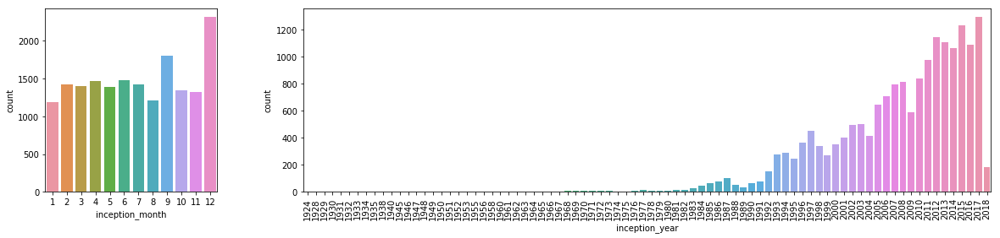

In [200]:
# distribution of inception date by month and year
plt.figure(figsize=(20,4))
gs = gridspec.GridSpec(1, 2, width_ratios=[0.20, 0.80])

plt.subplot(gs[0])
sns.countplot(train['inception_month'])

plt.subplot(gs[1])
sns.countplot(train['inception_year'])
plt.xticks(rotation=90)

### Categorical columns 

In [201]:
train[cat_cols].head()

,category,fund_family,investment,size,morningstar_rating,morningstar_return_rating,morningstar_risk_rating,inception_month,inception_year
0,World Allocation,Deutsche Asset Management,Blend,Large,2,2,3,7,2007
1,Large Blend,Aberdeen,Value,Large,2,2,3,12,2011
2,Large Growth,Thrivent,Growth,Large,3,3,4,10,1999
3,Allocation--70% to 85% Equity,American Century Investments,Growth,Large,4,4,3,7,2000
4,Tactical Allocation,Horizon Investments,Blend,Large,5,5,4,1,2012


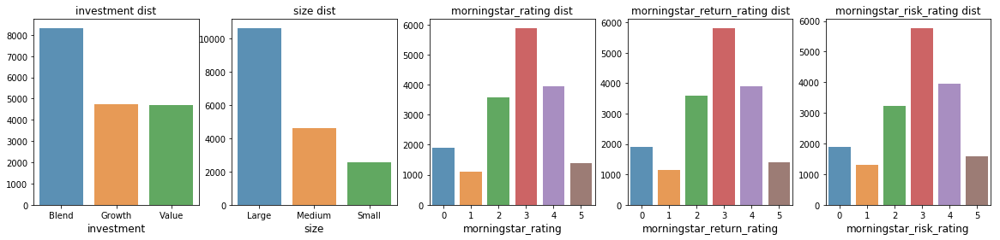

In [202]:
cols = ['investment','size','morningstar_rating','morningstar_return_rating','morningstar_risk_rating']

plt.figure(figsize=(20,4))
for i, col in enumerate(cols):
    plt.subplot(1,len(cols),i+1)
    val_cnt = train[col].value_counts()
    sns.barplot(val_cnt.index, val_cnt.values, alpha=0.8)
    plt.title('{0} dist'.format(col))
    #plt.ylabel('Number of Occurrences', fontsize=12)
    plt.xlabel(col, fontsize=12)

Text(0.5,0,'Counts')

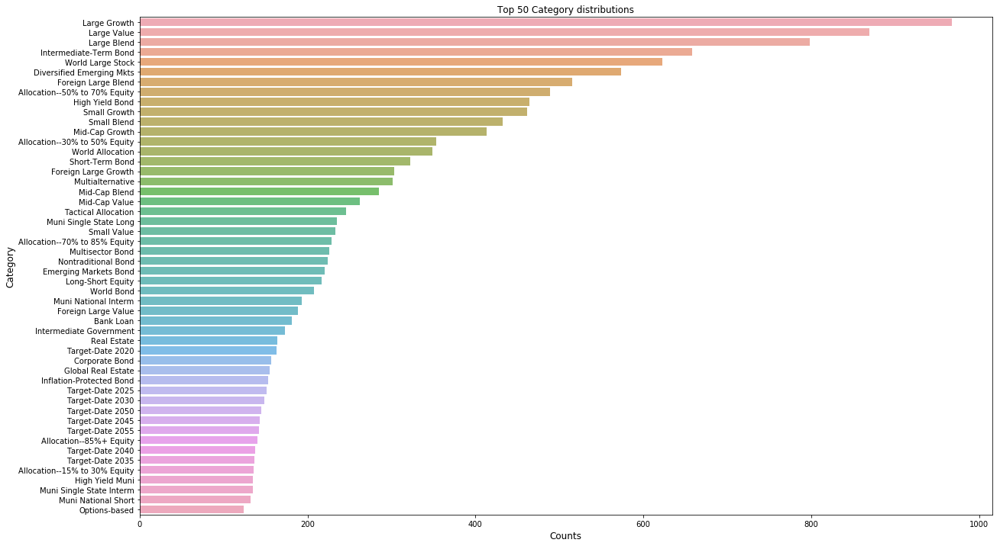

In [203]:
plt.figure(figsize=(20,12))

val_cnt = train['category'].value_counts().head(50)
sns.barplot(x=val_cnt.values, y=val_cnt.index, orient="h", alpha=0.8)
plt.title('Top 50 Category distributions')
plt.ylabel('Category', fontsize=12)
plt.xlabel('Counts', fontsize=12)

Text(0.5,0,'Counts')

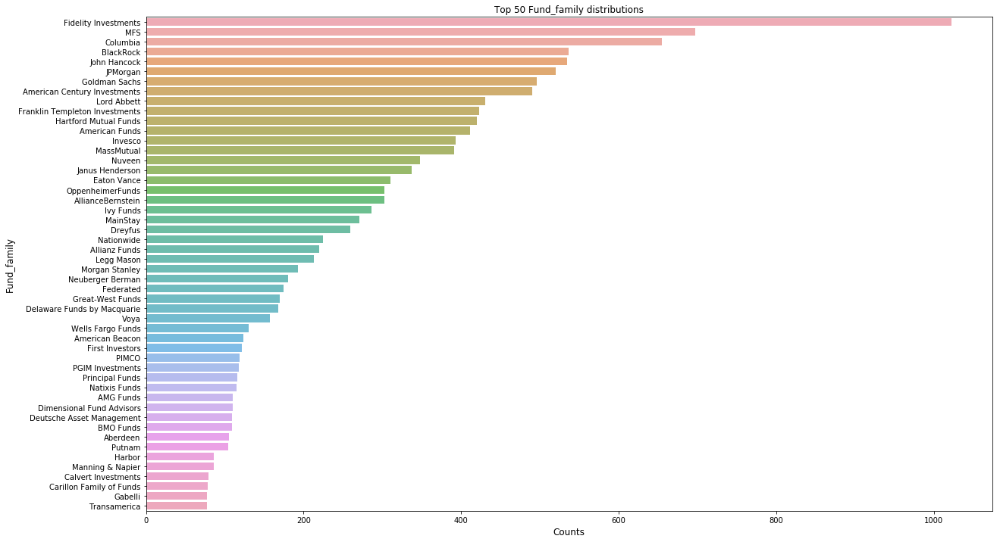

In [204]:
plt.figure(figsize=(20,12))

val_cnt = train['fund_family'].value_counts().head(50)
sns.barplot(x=val_cnt.values, y=val_cnt.index, orient="h", alpha=0.8)
plt.title('Top 50 Fund_family distributions')
plt.ylabel('Fund_family', fontsize=12)
plt.xlabel('Counts', fontsize=12)

### Numerical Columns

,total_net_assets,net_annual_expenses,price_earning
count,1.776800e+04,17768.000000,17768.000000
mean,2.437884e+09,1.021812,12.874546
std,1.015108e+10,0.627393,9.526126
min,5.000000e+03,0.000000,0.000000
25%,6.781000e+07,0.620000,0.000000
50%,3.325600e+08,0.960000,15.135000
75%,1.380000e+09,1.370000,17.150000
max,1.880000e+11,19.100000,178.250000


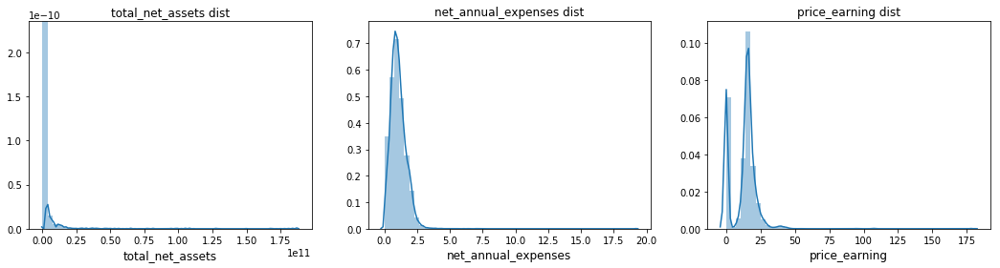

In [205]:
# net related columns
cols = ['total_net_assets','net_annual_expenses','price_earning']

display(train[cols].describe())

plt.figure(figsize=(18,4))

for i,col in enumerate(cols):
    plt.subplot(1,len(cols),i+1)
    sns.distplot(train[col])
    plt.title('{0} dist'.format(col))
    plt.xlabel(col, fontsize=12)

,portfolio_cash,portfolio_stocks,portfolio_bonds,portfolio_others,portfolio_preferred,portfolio_convertable
count,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000
mean,6.950042,59.097221,30.481821,1.588406,0.355747,0.619240
std,11.962977,42.187298,38.818028,6.603961,2.337376,5.137153
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.130000,0.450000,0.000000,0.000000,0.000000,0.000000
50%,2.960000,82.790000,1.540000,0.000000,0.000000,0.000000
75%,6.720000,97.460000,66.670000,0.860000,0.020000,0.010000
max,100.000000,100.000000,100.000000,94.710000,71.420000,93.820000


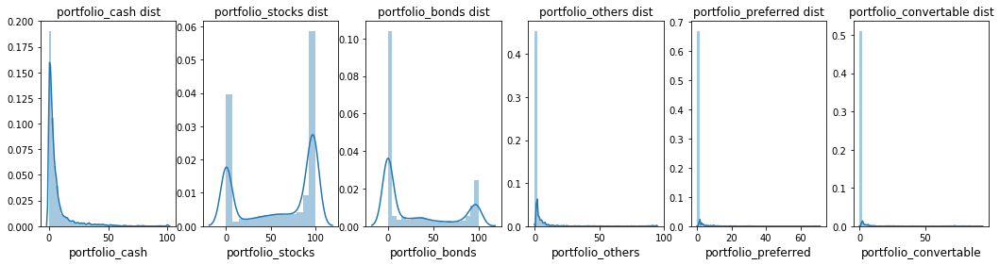

In [206]:
# portfolio columns
cols = ['portfolio_cash','portfolio_stocks','portfolio_bonds','portfolio_others','portfolio_preferred','portfolio_convertable']

display(train[cols].describe())

plt.figure(figsize=(18,4))

for i,col in enumerate(cols):
    plt.subplot(1,len(cols),i+1)
    sns.distplot(train[col])
    plt.title('{0} dist'.format(col))
    plt.xlabel(col, fontsize=12)

,sectors_basic_materials,sectors_consumer_cyclical,sectors_financial_services,sectors_real_estate,sectors_consumer_defensive,sectors_healthcare,sectors_utilities,sectors_communication_services,sectors_energy,sectors_industrials,sectors_technology
count,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000
mean,4.192569,9.351674,12.681374,4.639326,5.017008,7.966193,2.484941,1.982037,6.715616,8.825976,12.460546
std,8.049988,9.328251,12.458269,13.806894,6.003843,9.277547,7.352932,3.343989,15.251630,9.285550,12.208528
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.080000,10.520000,14.330000,1.350000,4.595000,8.365000,0.240000,1.180000,3.930000,9.520000,12.630000
75%,5.440000,13.530000,19.640000,3.930000,7.820000,12.530000,2.900000,3.070000,6.680000,12.740000,19.200000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,90.990000,100.000000,100.000000,100.000000


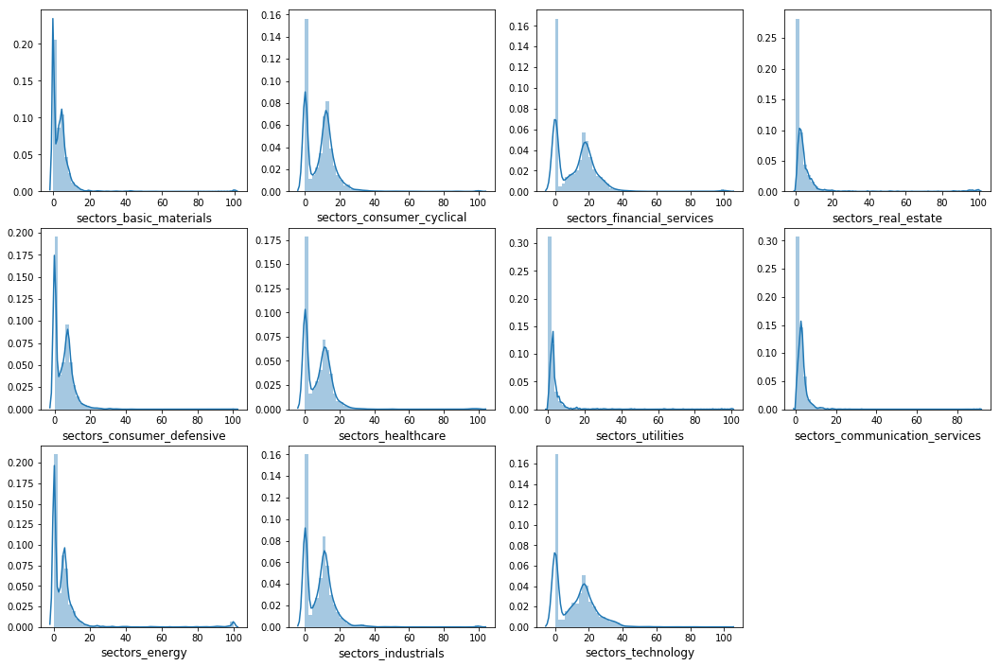

In [207]:
# Sector columns
cols = ['sectors_basic_materials','sectors_consumer_cyclical','sectors_financial_services','sectors_real_estate',\
        'sectors_consumer_defensive','sectors_healthcare','sectors_utilities','sectors_communication_services','sectors_energy',\
        'sectors_industrials','sectors_technology']

display(train[cols].describe())

plt.figure(figsize=(18,12))

for i,col in enumerate(cols):
    plt.subplot(3, np.floor(len(cols)/3)+1 ,i+1)
    sns.distplot(train[col])
    #plt.title('{0} dist'.format(col))
    plt.xlabel(col, fontsize=12)

,bonds_aaa,bonds_aa,bonds_a,bonds_bbb,bonds_bb,bonds_b,bonds_below_b,bonds_others
count,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000
mean,12.508568,4.530876,4.530876,5.736027,3.724536,3.484107,0.893201,1.844271
std,23.641712,12.330942,12.330942,11.979533,8.664260,9.558130,2.925774,12.768420
min,-7.600000,-11.460000,-11.460000,-226.260000,-33.700000,-12.390000,-21.740000,-40.720000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,13.640000,2.610000,2.610000,9.140000,2.292500,0.472500,0.000000,0.340000
max,104.170000,177.170000,177.170000,97.000000,78.310000,69.430000,46.200000,493.530000


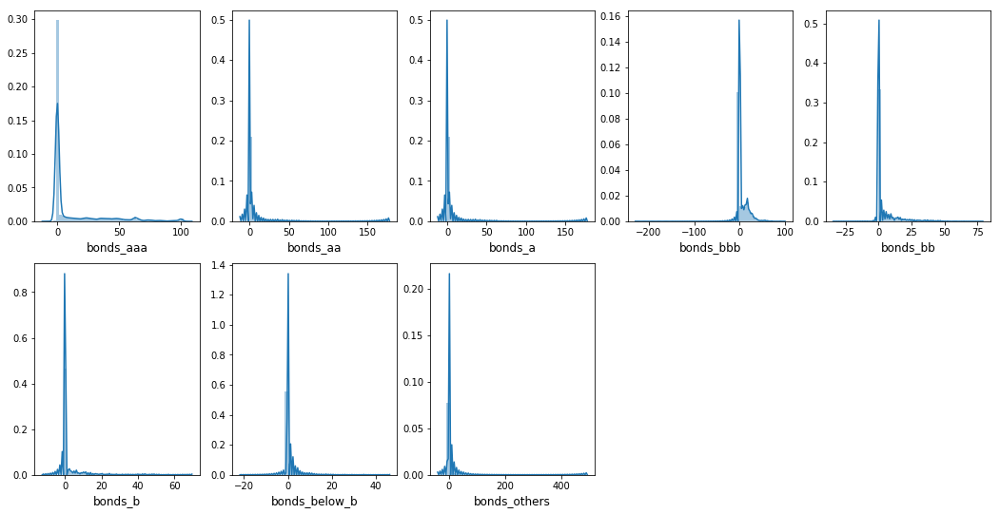

In [208]:
# Bonds columns
cols = ['bonds_aaa','bonds_aa','bonds_a','bonds_bbb','bonds_bb','bonds_b','bonds_below_b','bonds_others']

display(train[cols].describe())

plt.figure(figsize=(18,9))

for i,col in enumerate(cols):
    plt.subplot(2, np.floor(len(cols)/2)+1 ,i+1)
    sns.distplot(train[col])
    #plt.title('{0} dist'.format(col))
    plt.xlabel(col, fontsize=12)

,returns_ytd,returns_2017,returns_2016,returns_2015,returns_2014,returns_2013,returns_2012,returns_2011,returns_2010
count,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000
mean,0.631379,13.389062,5.984657,-1.550329,3.564234,10.690635,7.501730,-0.695844,6.576916
std,3.959679,11.317632,7.729235,5.577417,6.480067,15.558435,8.142978,6.095435,8.935471
min,-35.710000,-55.310000,-40.530000,-56.950000,-42.400000,-52.880000,-32.370000,-42.710000,-50.130000
25%,-1.340000,3.960000,0.000000,-2.730000,0.000000,0.000000,0.000000,-1.170000,0.000000
50%,-0.090000,12.130000,4.680000,0.000000,2.115000,0.000000,6.025000,0.000000,0.000000
75%,1.530000,20.780000,9.532500,0.250000,6.962500,23.432500,14.240000,0.000000,12.690000
max,34.110000,80.880000,73.020000,49.820000,63.800000,116.380000,65.820000,55.810000,54.500000


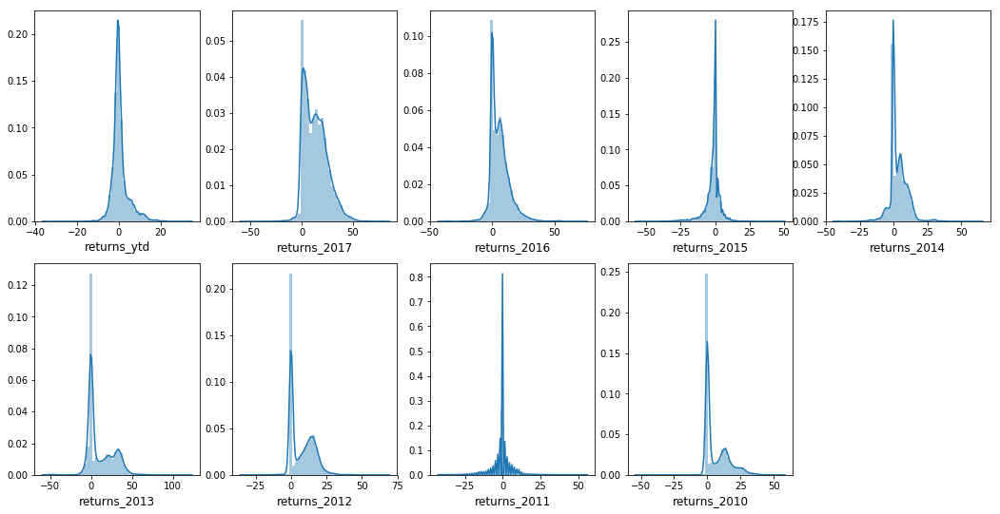

In [209]:
# returns columns
cols = ['returns_ytd','returns_2017','returns_2016','returns_2015','returns_2014','returns_2013','returns_2012',\
             'returns_2011','returns_2010' ]

display(train[cols].describe())

plt.figure(figsize=(18,9))

for i,col in enumerate(cols):
    plt.subplot(2, np.floor(len(cols)/2)+1, i+1)
    sns.distplot(train[col])
    #plt.title('{0} dist'.format(col))
    plt.xlabel(col, fontsize=12)

,alpha_3y,beta_3y,mean_annual_return_3y,standard_deviation_3y,sharpe_ratio_3y,treynor_ratio_3y
count,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000,17768.000000
mean,-0.329823,0.790521,0.415102,7.875360,0.481406,5.444235
std,3.026706,0.508040,0.363297,5.339022,0.401034,61.131649
min,-33.370000,-9.970000,-3.410000,0.000000,-2.920000,-5811.390000
25%,-1.410000,0.610000,0.140000,3.170000,0.220000,1.040000
50%,-0.190000,0.900000,0.370000,8.480000,0.540000,4.195000
75%,0.760000,1.040000,0.660000,11.550000,0.750000,7.630000
max,19.450000,23.790000,2.920000,39.580000,3.320000,3082.310000


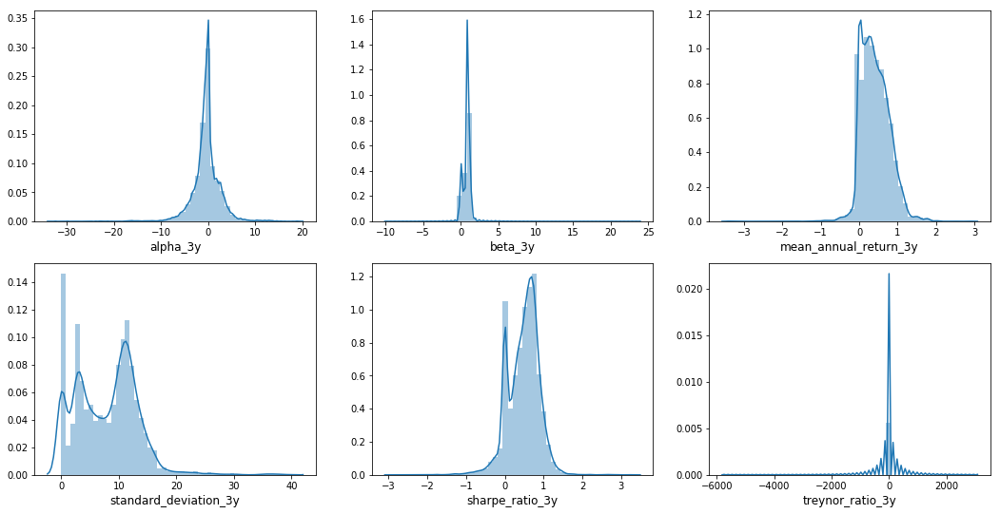

In [210]:
# 3years columns
cols = ['alpha_3y','beta_3y','mean_annual_return_3y','standard_deviation_3y','sharpe_ratio_3y','treynor_ratio_3y']

display(train[cols].describe())

plt.figure(figsize=(18,9))

for i,col in enumerate(cols):
    plt.subplot(2, len(cols)/2, i+1)
    sns.distplot(train[col])
    #plt.title('{0} dist'.format(col))
    plt.xlabel(col, fontsize=12)

## Bivariate Analysis

<Figure size 1440x720 with 0 Axes>

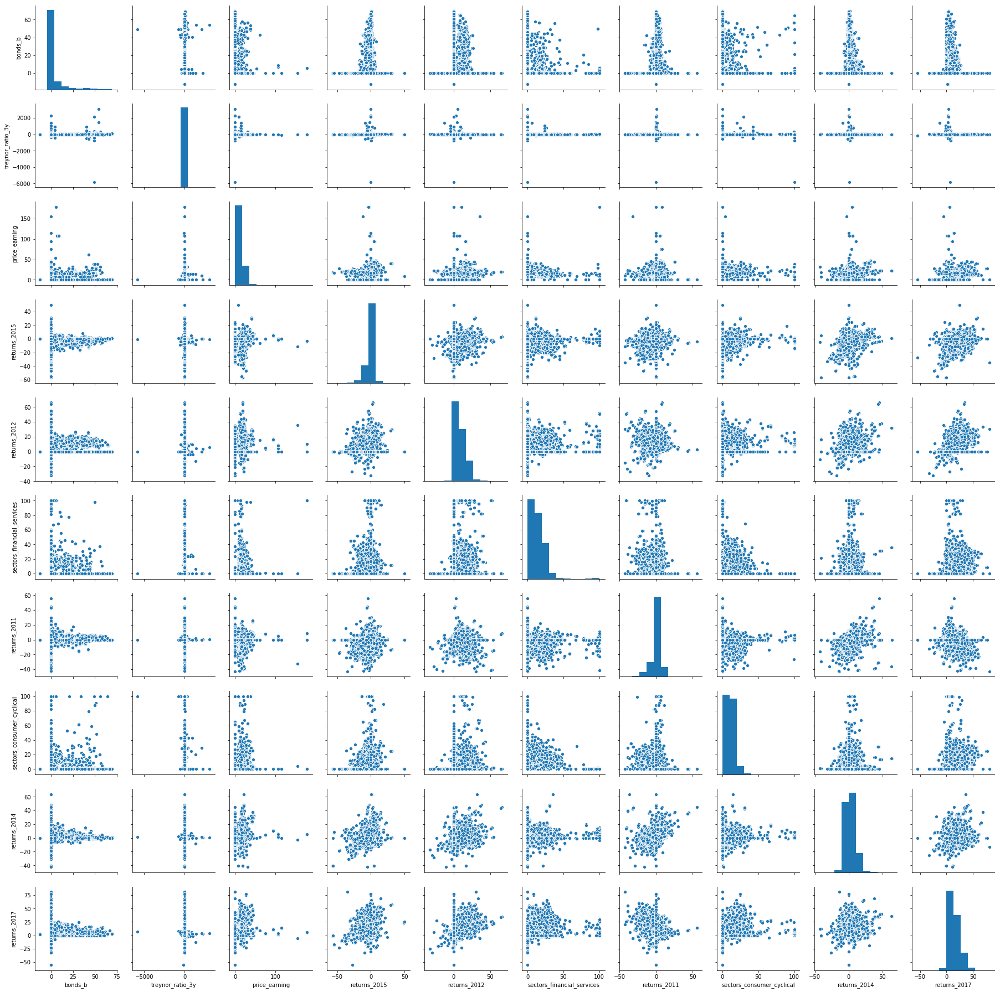

<Figure size 1440x720 with 0 Axes>

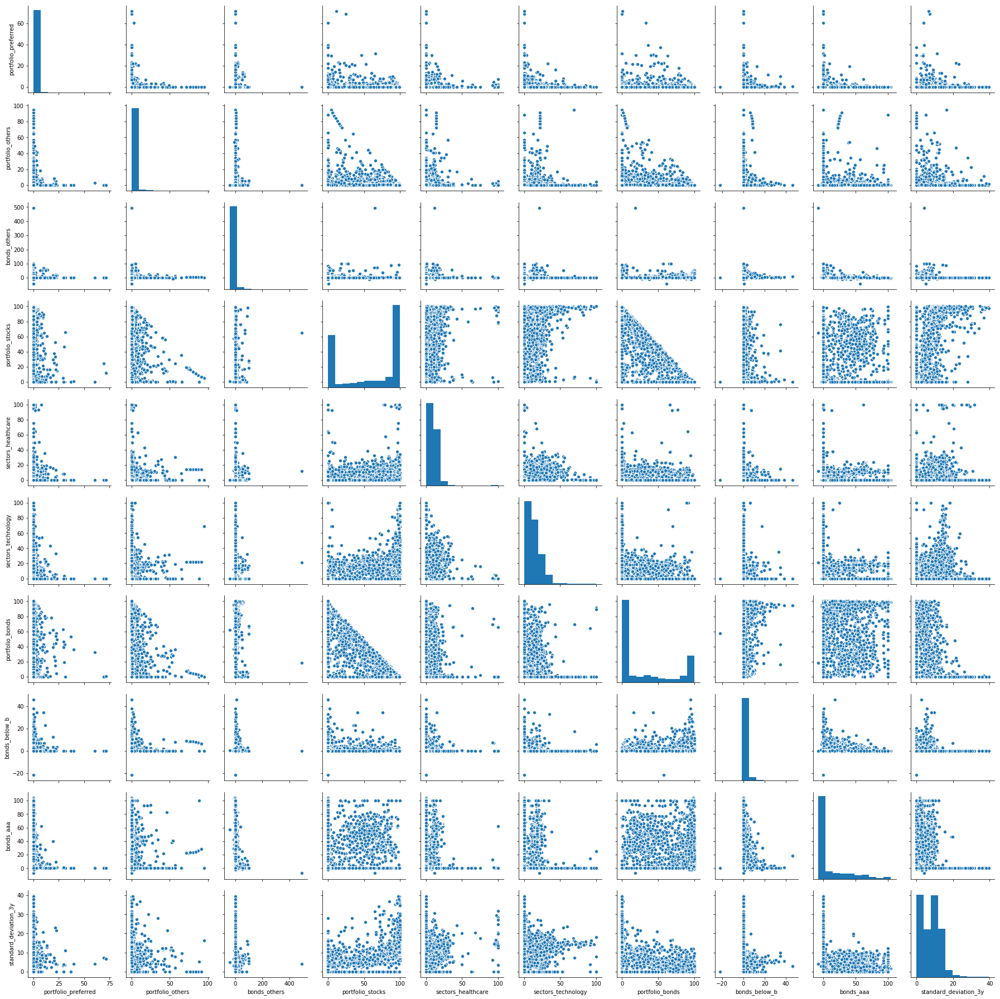

<Figure size 1440x720 with 0 Axes>

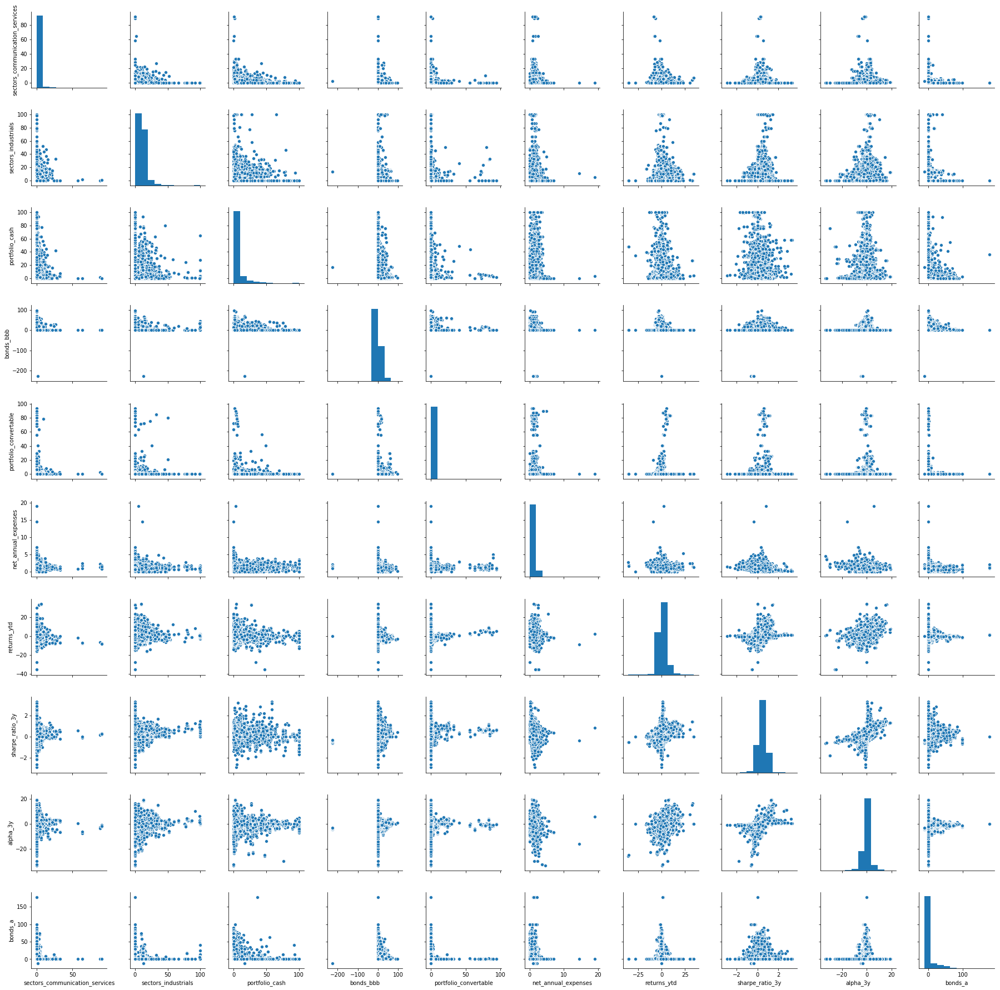

<Figure size 1440x720 with 0 Axes>

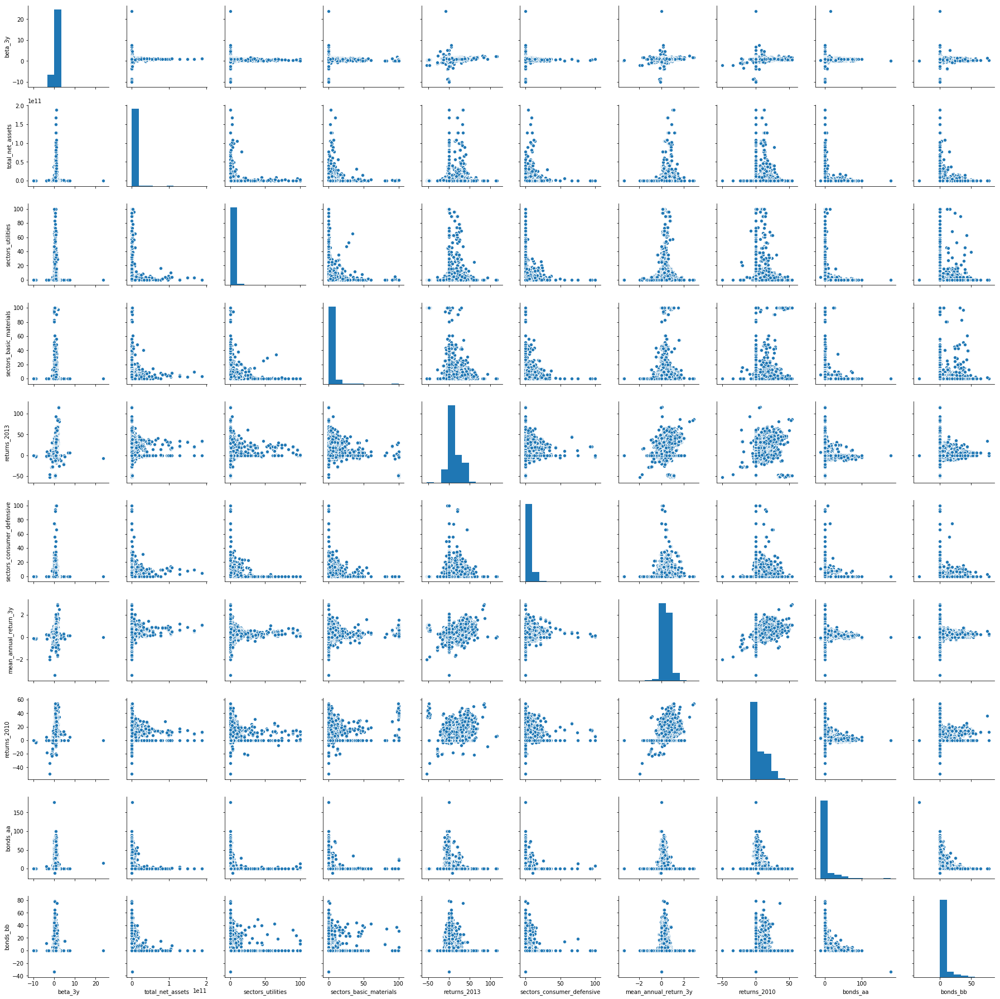

<Figure size 1440x720 with 0 Axes>

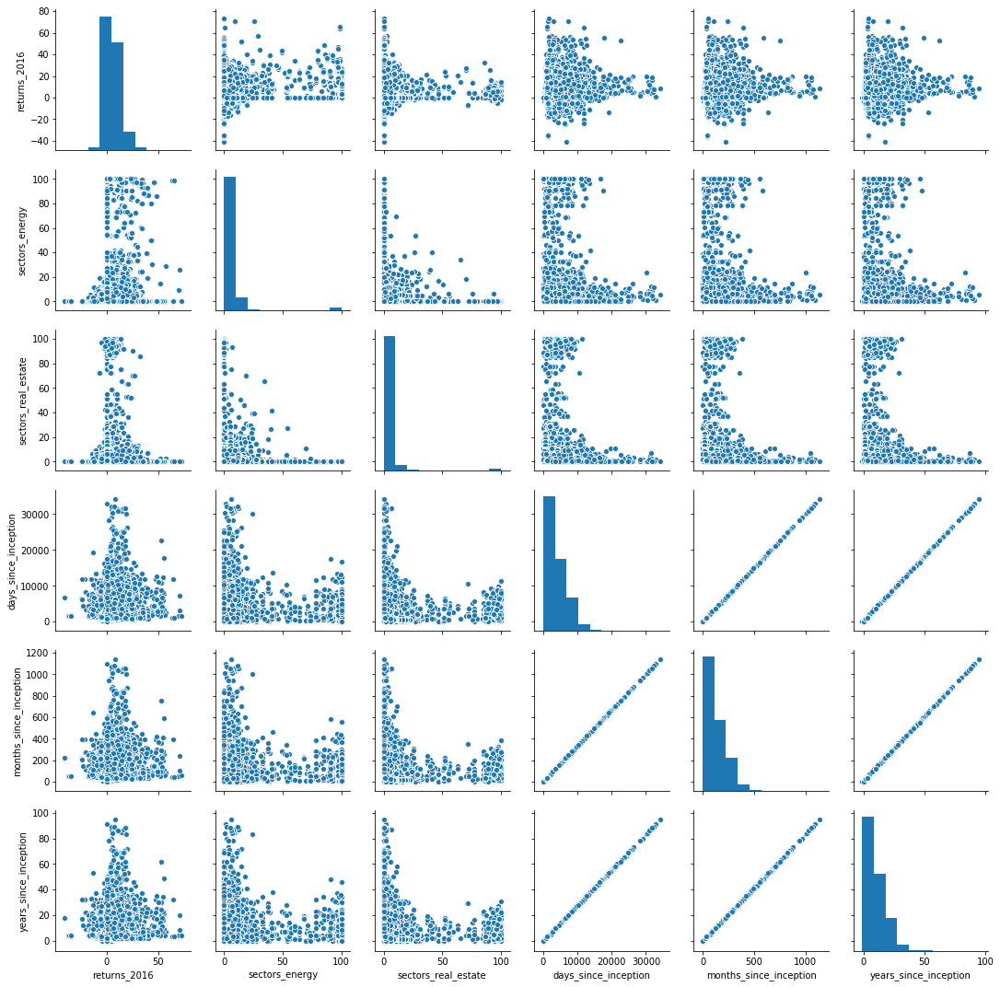

In [211]:

idx = 0
for i in range(10,51,10):
    plt.figure(figsize=(20, 10))
    sns.pairplot(train[num_cols].iloc[:,idx:i])
    idx = i


## Multivariate Analysis

Let's plot the heatmap and check for the correlation between the numeric independent variables

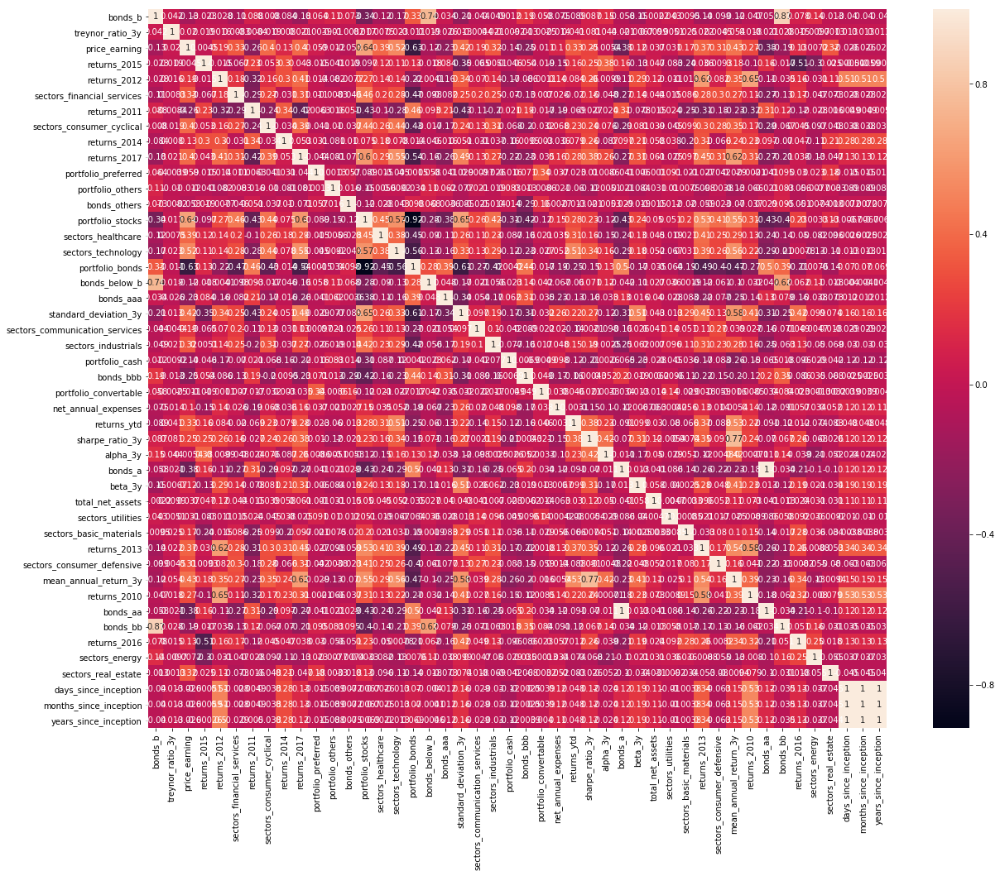

In [212]:
plt.figure(figsize=(20,16))
sns.heatmap(train[num_cols].corr(), annot=True)

In [213]:

# get only the highly correlated variables
df = df.corr().unstack().drop_duplicates().reset_index(name='corr').sort_values('corr', ascending=False)
df = df.loc[( df['corr'] >= 0.50 ) & ( df['corr'] < 1.0 )]

cols = list(set(df['level_0']).union(set(df['level_1'])))
cols


['morningstar_risk_rating',
 'returns_ytd',
 'sharpe_ratio_3y',
 'returns_2012',
 'price_earning',
 'morningstar_rating',
 'returns_2017',
 'days_since_inception',
 'years_since_inception',
 'months_since_inception',
 'portfolio_stocks',
 'returns_2013',
 'sectors_technology',
 'returns_2010',
 'morningstar_return_rating',
 'standard_deviation_3y',
 'mean_annual_return_3y']

#### Pairplot for highly correlated variables

<Figure size 1440x720 with 0 Axes>

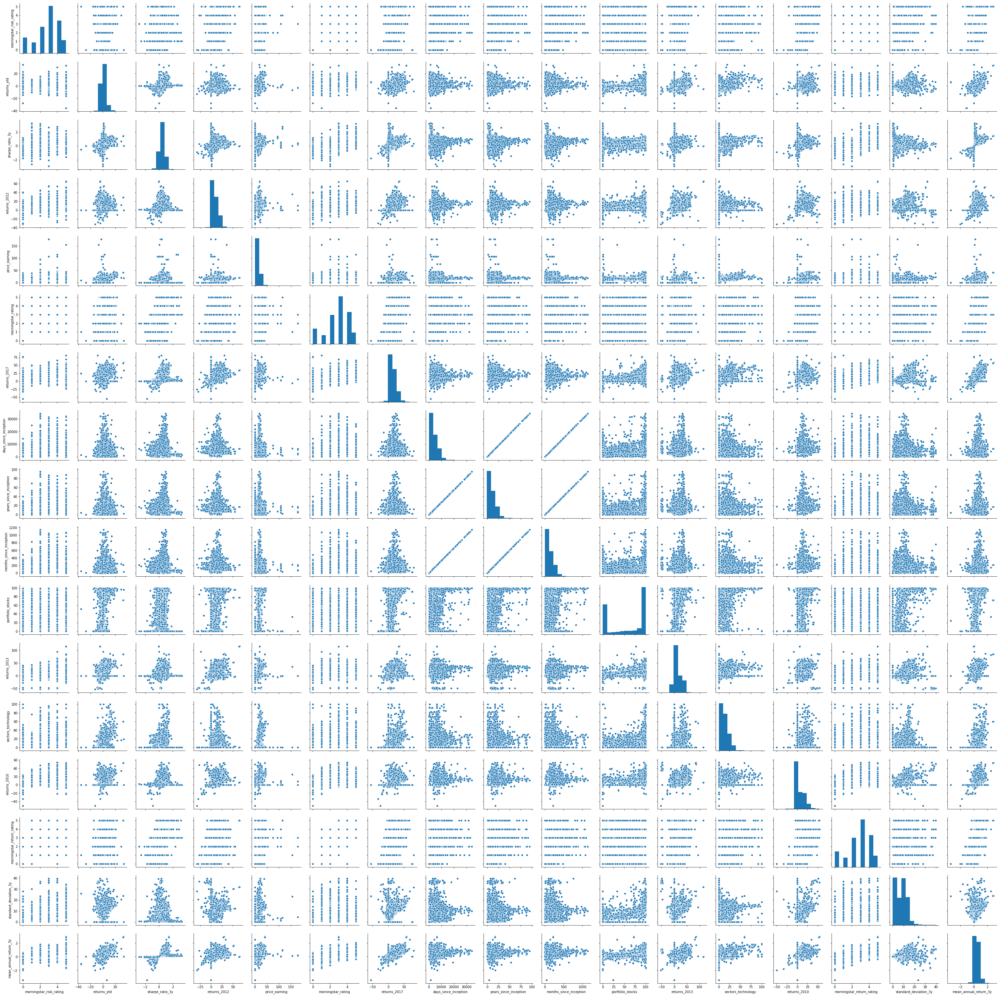

In [214]:
plt.figure(figsize=(20, 10))
sns.pairplot(train[cols])

The heatmap shows some useful insights:

**Correlation of bonds_aaa(target) with independent variables:**
* None of the variables have significant correlation with the bonds_aaa(target) variable.

**Correlation among the independent variables:**
* Many independent variables are highly correlated (look at the top-left part of matrix): *bonds_aaa, bonds_bb, returns_2017, returns_2013, beta_3y, months_since_inception, days_since_inception, portfolio_stocks, years_since_inception, sectors_technology, returns_2010, standard_deviation_3y, bonds_b, sharpe_ratio_3y, bonds_below_b, returns_2012, returns_ytd, mean_annual_return_3y, price_earning* are positively correlated.

# Data Preparation

Next, we'll **derive 3 clusters** from the **basis point spread zone of aaa rated mutual fund (bonds_aaa)**

In [215]:
bonds_aaa_cluster = train['bonds_aaa'].apply(lambda x : 3 if (x >= 100) else 2 if (x >= 50) else 1)
print(Counter(bonds_aaa_cluster))

Counter({1: 15946, 2: 1645, 3: 177})


We'll take a **copy of bonds_aaa** to use it later on and **drop the bonds columns** as we don't need that further.

In [216]:
# backup of bonds_aaa
bonds_aaa = train['bonds_aaa']

# drop the bonds cols
cols = ['bonds_aaa','bonds_aa','bonds_a','bonds_bbb','bonds_bb','bonds_b','bonds_below_b','bonds_others']
train.drop(cols, axis=1, inplace=True)

Next, we'll take a **copy of Serial Number** for later use before we drop.

In [217]:
train_SNO = train['Serial Number']
test_SNO = test['Serial Number']

Now we'll **drop the unwanted features**

In [218]:
train = train.loc[:,~(train.columns.isin(cols_to_exclude))]
test = test.loc[:,~(test.columns.isin(cols_to_exclude))]

Now will get the **updated num_cols list excluding bonds columns**

In [219]:
num_cols = list(set(num_cols).difference(set(['bonds_aaa','bonds_aa','bonds_a','bonds_bbb','bonds_bb','bonds_b','bonds_below_b','bonds_others'])))

Now we will print the first few records to view the data structure

In [220]:
train.head().T

,0,1,2,3,4
category,World Allocation,Large Blend,Large Growth,Allocation--70% to 85% Equity,Tactical Allocation
fund_family,Deutsche Asset Management,Aberdeen,Thrivent,American Century Investments,Horizon Investments
investment,Blend,Value,Growth,Growth,Blend
size,Large,Large,Large,Large,Large
total_net_assets,486740000,9980000,997620000,907850000,451260000
net_annual_expenses,1.22,1.44,1.2,0.91,1.36
morningstar_rating,2,2,3,4,5
portfolio_cash,3.51,1.78,5.37,2.38,3.16
portfolio_stocks,64.5,98.22,94.63,76.07,96.73
portfolio_bonds,15.12,0,0,19.34,0.01


In [221]:
test.head().T

,0,1,2,3,4
category,Large Blend,Small Blend,Allocation--50% to 70% Equity,Intermediate-Term Bond,Large Blend
fund_family,Pacific Funds Series Trust,Pacific Funds Series Trust,The Pacific Financial Group,PNC Funds,The Pacific Financial Group
investment,Blend,Growth,Blend,Blend,Blend
size,Large,Medium,Large,Medium,Large
total_net_assets,18170000,257730000,227230000,19650000,312040000
net_annual_expenses,1,1.3,0,1.53,0
morningstar_rating,3,3,0,1,0
portfolio_cash,1.47,3.56,9.62,0.57,2.29
portfolio_stocks,98.53,96.44,58.3,0,91.37
portfolio_bonds,0,0,25.44,99.23,5.43


#### Combine the train and test dataset to apply common encodings

We will join the training and test dataset to perform text and label encoding so as to eliminate the difference of values between the test and train dataset. Then we will separate the dataset again. 

In [222]:
train_idx = len(train)
print(train.shape)
print(test.shape)

full_df = train.append(test)
print(full_df.shape)

(17768, 47)
(7621, 47)
(25389, 47)


In [223]:
# Backup of full dataset
master_df = full_df.copy()

### Process Text columns

In [225]:
'''
from nltk.stem.porter import PorterStemmer
from nltk import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer

stemmer = PorterStemmer()

# preprocess function with stemming
def preprocess(document):

    # change sentence to lower case
    document = document.lower()

    # tokenize into words
    words = word_tokenize(document)

    # remove stop words
    words = [word for word in words if word not in stopwords.words("english")]
    
    words = [stemmer.stem(word) for word in words]

    # join words to make sentence
    document = " ".join(words)
    
    return document
    
    
# Combine the text columns
text_cols = full_df['fund_name'] # + ' ' + full_df['category'] + ' ' + full_df['fund_family']

# preprocess the text column
text_cols = [preprocess(text_col) for text_col in text_cols]

#bag of words model
vectorizer = CountVectorizer()
bow_model = vectorizer.fit_transform(text_cols)

# look at the dataframe
text_cols_df = pd.DataFrame(bow_model.toarray(), columns = vectorizer.get_feature_names())

# Drop the original columns
#full_df.drop(['fund_name','category','fund_family'], axis=1, inplace=True)
full_df.drop(['fund_name'], axis=1, inplace=True)

#full_df = full_df.join(text_cols_df)
'''

'\nfrom nltk.stem.porter import PorterStemmer\nfrom nltk import word_tokenize\nfrom nltk.corpus import stopwords\nfrom sklearn.feature_extraction.text import CountVectorizer\n\nstemmer = PorterStemmer()\n\n# preprocess function with stemming\ndef preprocess(document):\n\n    # change sentence to lower case\n    document = document.lower()\n\n    # tokenize into words\n    words = word_tokenize(document)\n\n    # remove stop words\n    words = [word for word in words if word not in stopwords.words("english")]\n    \n    words = [stemmer.stem(word) for word in words]\n\n    # join words to make sentence\n    document = " ".join(words)\n    \n    return document\n    \n    \n# Combine the text columns\ntext_cols = full_df[\'fund_name\'] # + \' \' + full_df[\'category\'] + \' \' + full_df[\'fund_family\']\n\n# preprocess the text column\ntext_cols = [preprocess(text_col) for text_col in text_cols]\n\n#bag of words model\nvectorizer = CountVectorizer()\nbow_model = vectorizer.fit_transform(

Skipped the text processing of fund_name column as it does not contain any useful info.

### Label Encode the categorical variables

In [226]:
lbl_enc = LabelEncoder()
full_df['category'] = lbl_enc.fit_transform(full_df['category'])
full_df['fund_family'] = lbl_enc.fit_transform(full_df['fund_family'])

inv_map = {'Blend': 1, 'Value': 2, 'Growth': 3}
full_df['investment'] = full_df['investment'].map(inv_map)

size_map = {'Small': 1, 'Medium': 2, 'Large': 3}
full_df['size'] = full_df['size'].map(size_map)

### Dummy Encode the categorical variables

Now we dummy encode the categorical columns and drop the original categorical columns

In [227]:
full_df = pd.get_dummies(full_df, columns=['category','fund_family','investment','size'], drop_first=True)

#### Now we will separate the dataset.

In [228]:
train = full_df.iloc[:train_idx]
test = full_df.iloc[train_idx:]
print(train.shape)
print(test.shape)

(17768, 917)
(7621, 917)


### Log Transform the numeric features

As almost all the features are positively skewed, we'll log transform the numerical features to neutralize the positive skewness in the dataset.

In [229]:
# log transform with constant 10000 for real numbers
train[num_cols] = np.log((10000 + train[num_cols]))
test[num_cols] = np.log((10000 + test[num_cols]))

In [230]:
train.fillna(0, inplace=True)
test.fillna(0, inplace=True)

### Standardize the numeric features
Now, we'll standardize(rescale) the numerical features so as to have mean as 0 and SD as 1

In [231]:
train[num_cols] = ( train[num_cols] - train[num_cols].mean() ) / train[num_cols].std()
test[num_cols] = ( test[num_cols] - test[num_cols].mean() ) / test[num_cols].std()

Before we start building the model, we we'll check for the missing values once to ensure data is clean.

In [232]:
df = test.isnull().sum().reset_index(name='missing_cnt')
df.loc[df['missing_cnt']>0].sort_values('missing_cnt', ascending=False)

,index,missing_cnt


### Split into train and validation dataset

In [233]:
X = train
Y = bonds_aaa_cluster

X_train, X_valid, Y_train, Y_valid = train_test_split(X, Y, test_size=0.2, random_state=RANDOM_STATE)
print(X_train.shape, Y_train.shape)
print(X_valid.shape, Y_valid.shape)

(14214, 917) (14214,)
(3554, 917) (3554,)


# PCA

Let's apply PCA on the training dataset for dimensionality reduction and feature selection.

In [234]:
#initialize the pca with randomized
pca = PCA(svd_solver='randomized', random_state=RANDOM_STATE)
# fit the training dataset
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

Draw the screeplot for the PCA components and pick the right number of PC components to build the model

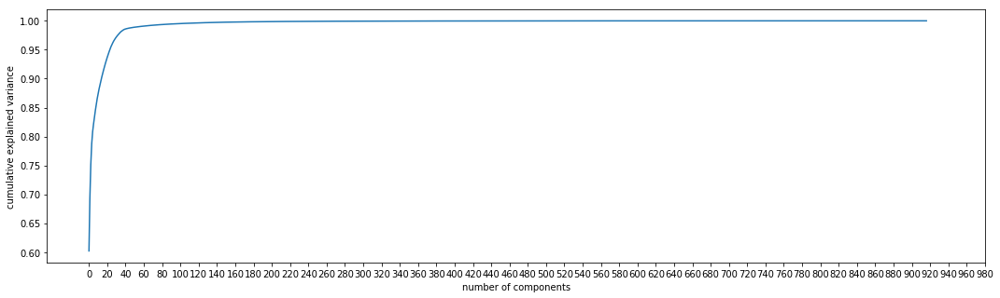

In [235]:
#Screeplot for the PCA components
%matplotlib inline
fig = plt.figure(figsize = (18,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xticks(np.arange(0, 1000, 20))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

Chosen 40 PCA components for model building

In [236]:
# Initialize pca with 40 components
pca = PCA(n_components=40, random_state=RANDOM_STATE)
# fit and transform the training dataset
X_train_pca = pca.fit_transform(X_train)
# transform the validation dataset
X_valid_pca = pca.transform(X_valid)
# transform the testing dataset
X_test_pca = pca.transform(test)
# Whole dataset
X_pca = pca.transform(X)

# Baseline Model Building

In [237]:
'''
Method Name : evaluate_model
Input(s)    : 2 series
Output(s)   : 1 float value  
Description :
- This method gets 2 series (actual and predicted) as inputs and compute the accuracy scores  
- Then returns the computed scores. 
'''
def evaluate_model(actual, pred):
    # Accuracy Score
    acc_score = round(accuracy_score(actual, pred)*100,2)
    print('Accuracy Score : ',acc_score)
    print(confusion_matrix(actual,pred))
    return acc_score

In [238]:

# List to store the model scores
model_score_list = []

# Classifier model List
models = {
    'LogisticRegression': LogisticRegression( multi_class='ovr', class_weight='balanced', random_state=RANDOM_STATE),
    'GaussianNB': GaussianNB(),
    'KNeighborsClassifier': KNeighborsClassifier(weights='uniform'),
    'SVC_Linear': SVC( kernel='linear', class_weight='balanced', probability=True, random_state=RANDOM_STATE),
    'SVC_Poly': SVC( kernel='poly', class_weight='balanced', probability=True, random_state=RANDOM_STATE),
    'SVC_RBF': SVC( kernel='rbf', class_weight='balanced', probability=True, random_state=RANDOM_STATE),
    'RandomForestClassifier': RandomForestClassifier(class_weight='balanced', random_state=RANDOM_STATE),
    'ExtraTreesClassifier': ExtraTreesClassifier(class_weight='balanced', random_state=RANDOM_STATE),
    'AdaBoostClassifier': AdaBoostClassifier(random_state=RANDOM_STATE),
    'GradientBoostingClassifier': GradientBoostingClassifier(random_state=RANDOM_STATE),
    'XGBClassifier': XGBClassifier(random_state=RANDOM_STATE)
}

for key in models.keys():
    print(key)
    print('---------------------------')
    
    models[key].fit(X_train_pca, Y_train)
    Y_pred = models[key].predict(X_valid_pca)

    acc_score = evaluate_model(Y_valid, Y_pred)
    
    # add the model scores to score list 
    model_score_list.append({'model_name': key, 'acc_score': acc_score})

    print('\n')
    
# convert the model scores to dataframe
model_score_df = pd.DataFrame(model_score_list, columns=['model_name', 'acc_score'])

# Order by highest recall score and roc_auc_score
model_score_df.sort_values(['acc_score'], ascending=False)


LogisticRegression
---------------------------
Accuracy Score :  85.51
[[2849  265   70]
 [ 129  162   34]
 [   9    8   28]]


GaussianNB
---------------------------
Accuracy Score :  60.5
[[1857 1290   37]
 [  34  267   24]
 [   7   12   26]]


KNeighborsClassifier
---------------------------
Accuracy Score :  93.28
[[3108   76    0]
 [ 120  204    1]
 [  29   13    3]]


SVC_Linear
---------------------------
Accuracy Score :  71.38
[[2241  747  196]
 [  27  257   41]
 [   3    3   39]]


SVC_Poly
---------------------------
Accuracy Score :  84.19
[[2668  495   21]
 [  21  289   15]
 [   4    6   35]]


SVC_RBF
---------------------------
Accuracy Score :  86.72
[[2759  411   14]
 [  20  289   16]
 [   5    6   34]]


RandomForestClassifier
---------------------------
Accuracy Score :  94.63
[[3170   12    2]
 [ 142  179    4]
 [  24    7   14]]


ExtraTreesClassifier
---------------------------
Accuracy Score :  95.67
[[3176    6    2]
 [ 114  207    4]
 [  20    8   17]]


AdaBoo

,model_name,acc_score
7,ExtraTreesClassifier,95.67
6,RandomForestClassifier,94.63
9,GradientBoostingClassifier,93.39
2,KNeighborsClassifier,93.28
10,XGBClassifier,91.73
8,AdaBoostClassifier,87.82
5,SVC_RBF,86.72
0,LogisticRegression,85.51
4,SVC_Poly,84.19
3,SVC_Linear,71.38


# Hyperparameter Tuning

None of the model is classifying all the three classes propely. We will pick the top 3 or 4 models that classifies all the classes accurately.

Let's tune the hyperparameters for the top 4 models **GaussianNB, KNeighborsClassifier, SVC_RBF, ExtraTreesClassifier** that contributes for classifying all the three classes.

In [239]:

models = {
    'LogisticRegression': LogisticRegression( multi_class='ovr', class_weight='balanced', random_state=RANDOM_STATE),
    'GaussianNB': GaussianNB(),
    'KNeighborsClassifier': KNeighborsClassifier(weights='uniform'),
    'SVC_Linear': SVC(class_weight='balanced', probability=True, random_state=RANDOM_STATE),
    'SVC_Poly': SVC(class_weight='balanced', probability=True, random_state=RANDOM_STATE),
    'SVC_RBF': SVC(class_weight='balanced', probability=True, random_state=RANDOM_STATE),
    'RandomForestClassifier': RandomForestClassifier(class_weight='balanced', random_state=RANDOM_STATE),
    'ExtraTreesClassifier': ExtraTreesClassifier(class_weight='balanced', random_state=RANDOM_STATE),
    'AdaBoostClassifier': AdaBoostClassifier(random_state=RANDOM_STATE),
    'GradientBoostingClassifier': GradientBoostingClassifier(random_state=RANDOM_STATE),
    'XGBClassifier': XGBClassifier(random_state=RANDOM_STATE)
}

params_grid = {
    'LogisticRegression': { 'penalty': ['l1', 'l2'], 'C': [1, 2, 3] },
    'GaussianNB': {},
    'KNeighborsClassifier': { 'n_neighbors': [1, 2, 3], 'p': [1, 2, 3] },
    'SVC_Linear':  { 'kernel': ['linear'], 'C': [1, 10] },
    'SVC_Poly': { 'kernel': ['poly'], 'degree': [2, 5], 'C': [0, 50], 'coef0': [0, 1] },
    'SVC_RBF': { 'kernel': ['rbf'], 'C': [1, 10], 'gamma': [0.001, 0.0001] },
    'RandomForestClassifier': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] },
    'ExtraTreesClassifier': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] },
    'AdaBoostClassifier': { 'n_estimators': [10, 100, 500], 'learning_rate': [0.001, 0.01, 1.0], 'max_depth': [1, 3, 5] },
    'GradientBoostingClassifier': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] },
    'XGBClassifier': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] }
}

hyper_tune_list = [
                #'LogisticRegression',
                'GaussianNB',
                'KNeighborsClassifier',
                #'SVC_Linear',
                #'SVC_Poly',
                'SVC_RBF',
                #'RandomForestClassifier',
                'ExtraTreesClassifier',
                #'AdaBoostClassifier',
                #'GradientBoostingClassifier',
                #'XGBClassifier',
                None
               ]

n_splits = 2
n_iter = 1

for item in hyper_tune_list:
    if( item is not None ):
        print(item)
        print('---------------------------')
                
        # initialize the StratifiedKFold 
        cv_fold = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state = RANDOM_STATE)

        # initialize the RandomSearchCV
        #grid = GridSearchCV(estimator=model, param_grid=params, scoring='recall', n_jobs=-1, cv=skf.split(X,Y), verbose=3 )
        grid = RandomizedSearchCV(estimator=models[item], param_distributions=params_grid[item], n_iter=n_iter, scoring='accuracy', 
                                  n_jobs=-1, cv=cv_fold.split(X_pca,Y), verbose=3, random_state=RANDOM_STATE )

        # fit the whole pca dataset
        grid.fit(X_pca, Y)

        # print the grid results
        print('\nBest estimator:')
        print(grid.best_estimator_)
        print('\nBest parameters:')
        print(grid.best_params_)
        print('\nBest score:')
        print(grid.best_score_)

        print("\nGrid scores:")
        cv_means = grid.cv_results_['mean_test_score']
        cv_stds = grid.cv_results_['std_test_score']

        for cv_mean, cv_std, cv_params in zip(cv_means, cv_stds, grid.cv_results_['params']):
            print("%0.3f (+/- %0.03f) for %r"
                  % (cv_mean, cv_std * 2, cv_params))
        print('\n')


GaussianNB
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.3s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.



Best estimator:
GaussianNB(priors=None, var_smoothing=1e-09)

Best parameters:
{}

Best score:
0.6022624943719046

Grid scores:
0.602 (+/- 0.094) for {}


KNeighborsClassifier
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    9.9s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.



Best estimator:
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=3, p=2,
           weights='uniform')

Best parameters:
{'p': 2, 'n_neighbors': 3}

Best score:
0.9259905447996398

Grid scores:
0.926 (+/- 0.004) for {'p': 2, 'n_neighbors': 3}


SVC_RBF
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:  1.8min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:  1.8min finished



Best estimator:
SVC(C=1, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
  max_iter=-1, probability=True, random_state=42, shrinking=True,
  tol=0.001, verbose=False)

Best parameters:
{'kernel': 'rbf', 'gamma': 0.0001, 'C': 1}

Best score:
0.6090724898694282

Grid scores:
0.609 (+/- 0.019) for {'kernel': 'rbf', 'gamma': 0.0001, 'C': 1}


ExtraTreesClassifier
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    4.8s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    4.8s finished



Best estimator:
ExtraTreesClassifier(bootstrap=False, class_weight='balanced',
           criterion='gini', max_depth=1, max_features=5,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=None, oob_score=False, random_state=42,
           verbose=0, warm_start=False)

Best parameters:
{'n_estimators': 500, 'max_features': 5, 'max_depth': 1}

Best score:
0.7010918505177848

Grid scores:
0.701 (+/- 0.009) for {'n_estimators': 500, 'max_features': 5, 'max_depth': 1}




# Ensemble Model Building

We will ensemble the above 4 models and prepare a classifier using VotingClassifier.

In [240]:
clf1 = GaussianNB()
clf2 = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
            metric_params=None, n_jobs=None, n_neighbors=1, p=1,
            weights='uniform')
clf3 = SVC(C=1, cache_size=200, class_weight='balanced', coef0=0.0,
            decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
            max_iter=-1, probability=True, random_state=42, shrinking=True,
            tol=0.001, verbose=False)
clf4 = ExtraTreesClassifier(bootstrap=False, class_weight='balanced',
            criterion='gini', max_depth=None, max_features=5,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=500, n_jobs=None, oob_score=False, random_state=42,
            verbose=0, warm_start=False)

voting_clf = VotingClassifier(estimators=[('nb', clf1), ('knn', clf2), ('svc-rbf', clf3), ('ext', clf4)], voting='soft', 
                              weights=[2,3,1,5], flatten_transform=True)

voting_clf.fit(X_train_pca, Y_train)
Y_valid_pred = voting_clf.predict(X_valid_pca)

acc_score = evaluate_model(Y_valid, Y_valid_pred)

Accuracy Score :  96.85
[[3144   38    2]
 [  48  273    4]
 [  11    9   25]]


We could achieve about 96.85% accuracy on the validation dataset.

# Predictions on Test Dataset

Let's do the prediction on the test dataset to cluster the bonds_aaa.

In [241]:
voting_clf.fit(X_pca, Y)

Y_final_pred = voting_clf.predict(X_test_pca)
result_df = pd.DataFrame({'serial number':test_SNO,'bonds_aaa_cluster':Y_final_pred})
result_df.sample(10)

,serial number,bonds_aaa_cluster
4430,4431,1
3629,3630,1
3221,3222,1
7223,7224,1
1525,1526,1
3215,3216,1
7105,7106,1
7296,7297,1
725,726,1
6504,6505,1


In [242]:
result_df['bonds_aaa_cluster'].value_counts()

1    6864
2     722
3      35
Name: bonds_aaa_cluster, dtype: int64

# Data Preparation for bonds_aaa prediction

Now that we have successfully clustered the bonds_aaa values, we'll prepare the dataset for the bonds_aaa prediction.

First we will take a copy from the master dataframe.

In [243]:
full_df = master_df.copy()
print(full_df.shape)

(25389, 47)


## Label Encode the categorical variables

In [244]:
lbl_enc = LabelEncoder()
full_df['category'] = lbl_enc.fit_transform(full_df['category'])
full_df['fund_family'] = lbl_enc.fit_transform(full_df['fund_family'])

inv_map = {'Blend': 1, 'Value': 2, 'Growth': 3}
full_df['investment'] = full_df['investment'].map(inv_map)

size_map = {'Small': 1, 'Medium': 2, 'Large': 3}
full_df['size'] = full_df['size'].map(size_map)

# Feature Engineering

In [245]:
# returns features extraction
returns_cols = ['returns_ytd','returns_2017','returns_2016','returns_2015','returns_2014','returns_2013','returns_2012',\
             'returns_2011','returns_2010' ]

full_df['returns_tilldate'] = full_df.loc[:,returns_cols].sum(axis=1)

full_df['returns_last_1year'] = full_df['returns_ytd'] + full_df['returns_2017']
full_df['returns_last_2years'] = full_df['returns_last_1year'] + full_df['returns_2016']
full_df['returns_last_3years'] = full_df['returns_last_2years'] + full_df['returns_2015']
full_df['returns_last_4years'] = full_df['returns_last_3years'] + full_df['returns_2014']
full_df['returns_last_5years'] = full_df['returns_last_4years'] + full_df['returns_2013']
full_df['returns_last_6years'] = full_df['returns_last_5years'] + full_df['returns_2012']
full_df['returns_last_7years'] = full_df['returns_last_6years'] + full_df['returns_2011']
full_df['returns_last_8years'] = full_df['returns_last_7years'] + full_df['returns_2010']

#### Split the master dataframe into train and test

In [246]:
train = full_df.iloc[:train_idx]
test = full_df.iloc[train_idx:]
print(train.shape)
print(test.shape)

(17768, 56)
(7621, 56)


Include the **clustered bonds_aaa** column that we predicted above to train and test dataset.

In [247]:
train['bonds_aaa_cluster'] = bonds_aaa_cluster
print(train.shape)

(17768, 57)


In [248]:
test['bonds_aaa_cluster'] = Y_final_pred
print(test.shape)

(7621, 57)


Let's view the top few rows to check for the dataset structure.

In [249]:
train.head()

,category,fund_family,investment,size,total_net_assets,net_annual_expenses,morningstar_rating,portfolio_cash,portfolio_stocks,portfolio_bonds,...,returns_tilldate,returns_last_1year,returns_last_2years,returns_last_3years,returns_last_4years,returns_last_5years,returns_last_6years,returns_last_7years,returns_last_8years,bonds_aaa_cluster
0,107,227,1,3,486740000,1.22,2,3.51,64.50,15.12,...,32.03,15.82,19.83,10.12,13.15,13.97,23.29,19.83,32.03,1
1,41,22,2,3,9980000,1.44,2,1.78,98.22,0.00,...,63.87,15.89,27.15,24.13,33.82,63.87,63.87,63.87,63.87,1
2,42,686,3,3,997620000,1.20,3,5.37,94.63,0.00,...,112.31,38.74,36.48,46.17,56.22,91.11,108.90,102.61,112.31,1
3,3,53,3,3,907850000,0.91,4,2.38,76.07,19.34,...,82.97,20.89,27.84,26.54,33.75,53.93,69.02,67.35,82.97,1
4,84,348,1,3,451260000,1.36,5,3.16,96.73,0.01,...,58.17,24.84,29.40,25.20,31.10,58.17,58.17,58.17,58.17,1


In [250]:
test.head()

,category,fund_family,investment,size,total_net_assets,net_annual_expenses,morningstar_rating,portfolio_cash,portfolio_stocks,portfolio_bonds,...,returns_tilldate,returns_last_1year,returns_last_2years,returns_last_3years,returns_last_4years,returns_last_5years,returns_last_6years,returns_last_7years,returns_last_8years,bonds_aaa_cluster
0,41,537,1,3,18170000,1.00,3,1.47,98.53,0.00,...,31.82,22.53,31.82,31.82,31.82,31.82,31.82,31.82,31.82,1
1,81,537,3,2,257730000,1.30,3,3.56,96.44,0.00,...,19.41,19.41,19.41,19.41,19.41,19.41,19.41,19.41,19.41,1
2,2,680,1,3,227230000,0.00,0,9.62,58.30,25.44,...,-0.20,-0.20,-0.20,-0.20,-0.20,-0.20,-0.20,-0.20,-0.20,1
3,39,531,1,2,19650000,1.53,1,0.57,0.00,99.23,...,15.65,0.27,1.54,0.15,4.37,1.44,5.33,10.05,15.65,1
4,41,680,1,3,312040000,0.00,0,2.29,91.37,5.43,...,2.12,2.12,2.12,2.12,2.12,2.12,2.12,2.12,2.12,1


# Feature Selection

Let's use **XGBRegressor** model for feature selection as it is robust and more consistent model.

In [251]:
X = train
Y = bonds_aaa

model = XGBRegressor()
model.fit(X, Y)

# Check the feature importance score for each feature
feature_imp_df = pd.DataFrame({'Feature':X.columns, 'Score':model.feature_importances_})
# Order the features by max score
feature_imp_df = feature_imp_df.sort_values('Score', ascending=False).reset_index()
feature_imp_df.head(50)

,index,Feature,Score
0,9,portfolio_bonds,0.123167
1,0,category,0.109971
2,12,portfolio_convertable,0.079179
3,56,bonds_aaa_cluster,0.077713
4,1,fund_family,0.071848
5,10,portfolio_others,0.057185
6,37,beta_3y,0.042522
7,7,portfolio_cash,0.036657
8,39,standard_deviation_3y,0.027859
9,20,sectors_communication_services,0.024927


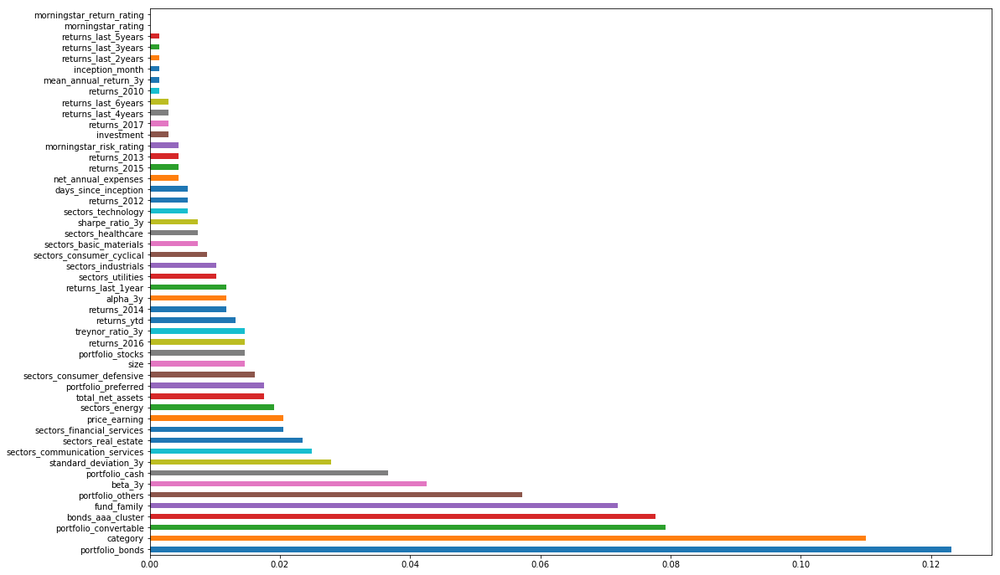

In [252]:
# plot the chart with top 50 important features
(pd.Series(model.feature_importances_, index=X.columns)
   .nlargest(50)
   .plot(kind='barh', figsize=(18,12))) 

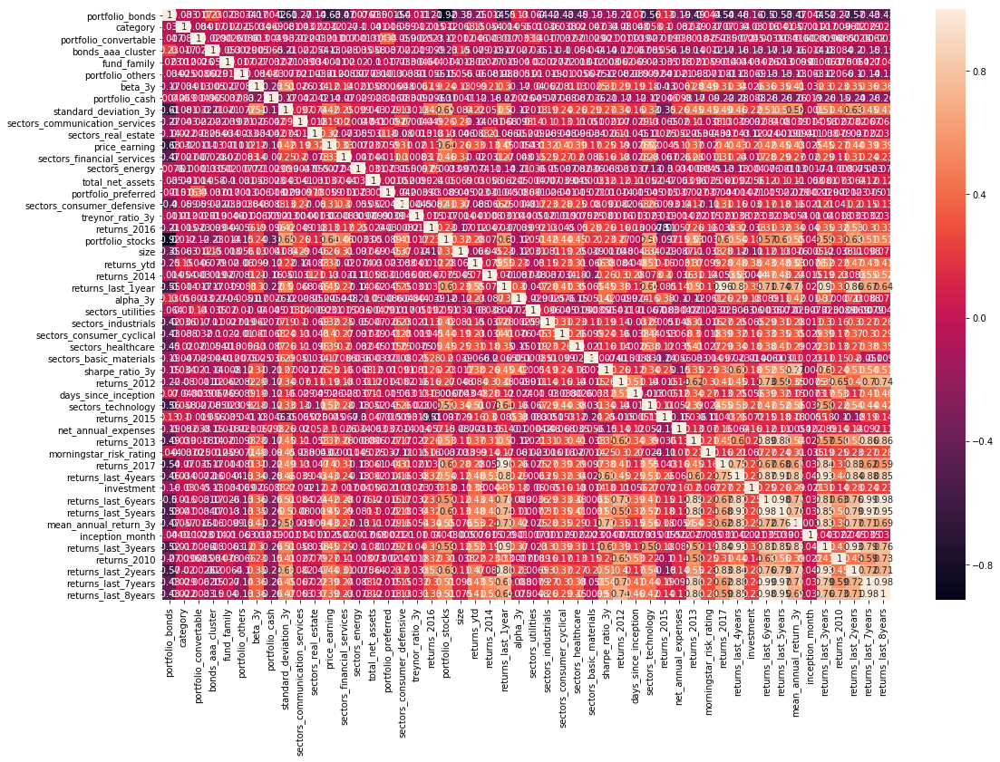

In [253]:
# Heatmap with top 50 features
top_50_features = feature_imp_df[:50]['Feature']
plt.figure(figsize=(18,12))
sns.heatmap(X[top_50_features].corr(), annot=True)

In [254]:
#selected the uncorrelated features from the top 50 features
cols = ['portfolio_bonds','category','portfolio_convertable','bonds_aaa_cluster','fund_family','portfolio_others','beta_3y',
        'portfolio_cash','sectors_communication_services','sectors_real_estate','price_earning','sectors_financial_services',
        'sectors_energy','total_net_assets','portfolio_preferred','sectors_consumer_defensive','treynor_ratio_3y','returns_2016',
        'size','returns_ytd','returns_2014','alpha_3y','sectors_utilities','sectors_industrials','sectors_consumer_cyclical',
        'sectors_healthcare','sectors_basic_materials','sharpe_ratio_3y','days_since_inception','returns_2015',
        'net_annual_expenses','morningstar_risk_rating','investment','inception_month']

X = train[cols]
Y = bonds_aaa
X_test = test[cols]


# fit the data in GLM model
logm = sm.GLM(Y,(sm.add_constant(X)), family = sm.families.Binomial())
modres = logm.fit()
# print the summary results
logm.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              bonds_aaa   No. Observations:                17768
Model:                            GLM   Df Residuals:                    17733
Model Family:                Binomial   Df Model:                           34
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 03 Dec 2018   Deviance:                          nan
Time:                        01:45:11   Pearson chi2:                 5.53e+22
No. Iterations:                   100   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                          -2.651e+19   4.34e+06  -6.11e+12      0.000   -2.65e+19   -2.65e+19
portfolio_bonds                 7.546e+16   2.36e+04    3.2e+12      0.000    7.55e+16    7.55e+16
category                        2.348e+16   1.71e+04   1.38e+12      0.000    2.35e+16    2.35e+16
portfolio_convertable            7.34e+15   1.07e+05   6.89e+10      0.000    7.34e+15    7.34e+15
bonds_aaa_cluster               2.285e+19   1.59e+06   1.43e+13      0.000    2.28e+19    2.28e+19
fund_family                      7.53e+14   2955.218   2.55e+11      0.000    7.53e+14    7.53e+14
portfolio_others                9.277e+16   7.81e+04   1.19e+12      0.000    9.28e+16    9.28e+16
beta_3y                         1.166e+18   1.29e+06   9.05e+11      0.000    1.17e+18    1.17e+18
portfolio_cash                   1.81e+16   4.61e+04   3.92e+11      0.000    1.81e+16    1.81e+16
sectors_communication_services -1.765e+16   1.67e+05  -1.06e+11      0.000   -1.77e+16   -1.77e+16
sectors_real_estate             1.205e+16   4.71e+04   2.56e+11      0.000    1.21e+16    1.21e+16
price_earning                   1.643e+16   8.35e+04   1.97e+11      0.000    1.64e+16    1.64e+16
sectors_financial_services      3.096e+16   5.01e+04   6.17e+11      0.000     3.1e+16     3.1e+16
sectors_energy                  5.109e+15   3.66e+04   1.39e+11      0.000    5.11e+15    5.11e+15
total_net_assets                2.082e+06   5.12e-05   4.07e+10      0.000    2.08e+06    2.08e+06
portfolio_preferred            -3.924e+16   2.35e+05  -1.67e+11      0.000   -3.92e+16   -3.92e+16
sectors_consumer_defensive      2.076e+16   1.04e+05      2e+11      0.000    2.08e+16    2.08e+16
treynor_ratio_3y               -7.762e+14   8286.116  -9.37e+10      0.000   -7.76e+14   -7.76e+14
returns_2016                   -1.539e+16   9.64e+04   -1.6e+11      0.000   -1.54e+16   -1.54e+16
size                             1.11e+18   8.91e+05   1.25e+12      0.000    1.11e+18    1.11e+18
returns_ytd                     5.212e+16   1.76e+05   2.96e+11      0.000    5.21e+16    5.21e+16
returns_2014                   -3.273e+16      1e+05  -3.26e+11      0.000   -3.27e+16   -3.27e+16
alpha_3y                       -9.459e+16   2.29e+05  -4.12e+11      0.000   -9.46e+16   -9.46e+16
sectors_utilities               2.095e+16   7.18e+04   2.92e+11      0.000     2.1e+16     2.1e+16
sectors_industrials             1.359e+16    6.3e+04   2.16e+11      0.000    1.36e+16    1.36e+16
sectors_consumer_cyclical       2.222e+15   6.47e+04   3.44e+10      0.000    2.22e+15    2.22e+15
sectors_healthcare              1.534e+16   6.93e+04   2.21e+11      0.000    1.53e+16    1.53e+16
sectors_basic_materials         9.263e+15   7.03e+04   1.32e+11      0.000    9.26e+15    9.26e+15
sharpe_ratio_3y                -5.353e+17   1.93e+06  -2.77e+11      0.000   -5.35e+17   -5.3

### Standardize the numerical features

Now, we'll standardize(rescale) the numerical features so as to have mean as 0 and SD as 1

In [255]:
#Standardize the numeric values
X = (( X - X.mean() ) / X.std())

## Split into train and validation dataset

In [256]:
X_train, X_valid, Y_train, Y_valid = train_test_split(X, Y, test_size=0.2, random_state=RANDOM_STATE)
print(X_train.shape, Y_train.shape)
print(X_valid.shape, Y_valid.shape)

(14214, 34) (14214,)
(3554, 34) (3554,)


# Baseline Model Building

In [257]:
'''
Method Name : evaluate_model_reg
Input(s)    : 2 series
Output(s)   : 3 float value  
Description :
- This method gets 2 series (actual and predicted) as inputs and compute the error scores  
- Then returns the error scores. 
'''
def evaluate_model_reg(actual, pred):
    r2 = r2_score(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    print('R2 Score :', r2)
    print('Root Mean Squared Error :', rmse)
    print('Mean Absolute Error :', mae)

    return r2, rmse, mae

In [258]:
# List to store the model scores
model_score_list = []

# Regressor model List
models = {
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'KNeighborsRegressor': KNeighborsRegressor(),
    'SVC_Linear': SVR( kernel='linear'),
    'SVC_Poly': SVR( kernel='poly'),
    'SVC_RBF': SVR( kernel='rbf'),
    'RandomForestRegressor': RandomForestRegressor(random_state=RANDOM_STATE),
    'ExtraTreesRegressor': ExtraTreesRegressor(random_state=RANDOM_STATE),
    'AdaBoostRegressor': AdaBoostRegressor(random_state=RANDOM_STATE),
    'GradientBoostingRegressor': GradientBoostingRegressor(random_state=RANDOM_STATE),
    'XGBRegressor': XGBRegressor(random_state=RANDOM_STATE)
}

for key in models.keys():
    print(key)
    print('---------------------------')
    
    models[key].fit(X_train, Y_train)
    Y_pred = models[key].predict(X_valid)

    r2_scr, rmse, mae = evaluate_model_reg(Y_valid, Y_pred)
    
    # add the model scores to score list 
    model_score_list.append({'model_name': key, 'r2_score': r2_scr, 'rmse': rmse, 'mae': mae})

    print('\n')
    
# convert the model scores to dataframe
model_score_df = pd.DataFrame(model_score_list, columns=['model_name', 'r2_score', 'rmse', 'mae'])

# Order by highest recall score and roc_auc_score
model_score_df.sort_values(['r2_score'], ascending=False)

LinearRegression
---------------------------
R2 Score : 0.7906387605716492
Root Mean Squared Error : 11.00887584386528
Mean Absolute Error : 7.450791450637955


Ridge
---------------------------
R2 Score : 0.7906403314694215
Root Mean Squared Error : 11.008834542402255
Mean Absolute Error : 7.450850047792646


Lasso
---------------------------
R2 Score : 0.7770647370115531
Root Mean Squared Error : 11.360153977910349
Mean Absolute Error : 7.81790662037008


KNeighborsRegressor
---------------------------
R2 Score : 0.9261902649399288
Root Mean Squared Error : 6.536596193885113
Mean Absolute Error : 2.752870568373664


SVC_Linear
---------------------------
R2 Score : 0.7295432726195172
Root Mean Squared Error : 12.512489551230047
Mean Absolute Error : 6.116238001474518


SVC_Poly
---------------------------
R2 Score : 0.4612516116466091
Root Mean Squared Error : 17.659883144000812
Mean Absolute Error : 7.913817007640257


SVC_RBF
---------------------------
R2 Score : 0.736381170508827

,model_name,r2_score,rmse,mae
8,ExtraTreesRegressor,0.979555,3.440204,1.034871
7,RandomForestRegressor,0.976579,3.682105,1.321487
3,KNeighborsRegressor,0.926190,6.536596,2.752871
10,GradientBoostingRegressor,0.894298,7.822351,4.875290
11,XGBRegressor,0.892399,7.892279,4.897210
9,AdaBoostRegressor,0.815099,10.345808,6.419257
1,Ridge,0.790640,11.008835,7.450850
0,LinearRegression,0.790639,11.008876,7.450791
2,Lasso,0.777065,11.360154,7.817907
6,SVC_RBF,0.736381,12.353302,5.852561


# Hyperparameter Tuning

We will tune the hyperparameters for the top 3 models **KNeighborsRegressor, ExtraTreesRegressor, XGBRegressor** from the above results.

In [259]:
# Regressor model List
models = {
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'KNeighborsRegressor': KNeighborsRegressor(),
    'SVC_Linear': SVR( kernel='linear'),
    'SVC_Poly': SVR( kernel='poly'),
    'SVC_RBF': SVR( kernel='rbf'),
    'RandomForestRegressor': RandomForestRegressor(random_state=RANDOM_STATE),
    'ExtraTreesRegressor': ExtraTreesRegressor(random_state=RANDOM_STATE),
    'AdaBoostRegressor': AdaBoostRegressor(random_state=RANDOM_STATE),
    'GradientBoostingRegressor': GradientBoostingRegressor(random_state=RANDOM_STATE),
    'XGBRegressor': XGBRegressor(random_state=RANDOM_STATE)
}

params_grid = {
    'LinearRegression': {},
    'Ridge': { 'alpha': [ 1e-15, 1e-10, 1e-8, 1e-5, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20 ] },
    'Lasso': { 'alpha': [ 1e-15, 1e-10, 1e-8, 1e-5, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20 ] },
    'KNeighborsRegressor': { 'n_neighbors': [1, 2, 3], 'p': [1, 2, 3] },
    'SVC_Linear':  { 'kernel': ['linear'], 'C': [1, 10] },
    'SVC_Poly': { 'kernel': ['poly'], 'degree': [2, 5], 'C': [0, 50], 'coef0': [0, 1] },
    'SVC_RBF': { 'kernel': ['rbf'], 'C': [1, 10], 'gamma': [0.001, 0.0001] },
    'RandomForestRegressor': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] },
    'ExtraTreesRegressor': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] },
    'AdaBoostRegressor': { 'n_estimators': [10, 100, 500], 'learning_rate': [0.001, 0.01, 1.0], 'max_depth': [1, 3, 5] },
    'GradientBoostingRegressor': { 'n_estimators': [10, 100, 500], 'max_features': [1, 3, 5], 'max_depth': [1, 3, 5] },
    'XGBRegressor': { 'n_estimators': [10, 100, 500], 'max_depth': [1, 3, 5] }
}

hyper_tune_list = [
                #'LinearRegression',
                #'Ridge',
                #'Lasso',
                'KNeighborsRegressor',
                #'SVC_Linear',
                #'SVC_Poly',
                #'SVC_RBF',
                #'RandomForestRegressor',
                'ExtraTreesRegressor',
                #'AdaBoostRegressor',
                #'GradientBoostingRegressor',
                'XGBRegressor',
                None
               ]

n_splits = 2
n_iter = 1

for item in hyper_tune_list:
    if( item is not None ):
        print(item)
        print('---------------------------')
                
        # initialize the KFold 
        cv_fold = KFold(n_splits=n_splits, shuffle = True, random_state = RANDOM_STATE)

        # initialize the RandomSearchCV
        #grid = GridSearchCV(estimator=model, param_grid=params, scoring='recall', n_jobs=-1, cv=skf.split(X,Y), verbose=3 )
        grid = RandomizedSearchCV(estimator=models[item], param_distributions=params_grid[item], n_iter=n_iter, scoring='r2', 
                                  n_jobs=-1, cv=cv_fold.split(X,Y), verbose=3, random_state=RANDOM_STATE )

        # fit the whole pca dataset
        grid.fit(X, Y)

        # print the grid results
        print('\nBest estimator:')
        print(grid.best_estimator_)
        print('\nBest parameters:')
        print(grid.best_params_)
        print('\nBest score:')
        print(grid.best_score_)

        print("\nGrid scores:")
        cv_means = grid.cv_results_['mean_test_score']
        cv_stds = grid.cv_results_['std_test_score']

        for cv_mean, cv_std, cv_params in zip(cv_means, cv_stds, grid.cv_results_['params']):
            print("%0.3f (+/- %0.03f) for %r"
                  % (cv_mean, cv_std * 2, cv_params))
        print('\n')



KNeighborsRegressor
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:   15.3s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:   15.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.



Best estimator:
KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=3, p=2,
          weights='uniform')

Best parameters:
{'p': 2, 'n_neighbors': 3}

Best score:
0.9016501686922371

Grid scores:
0.902 (+/- 0.002) for {'p': 2, 'n_neighbors': 3}


ExtraTreesRegressor
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.1s finished



Best estimator:
ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=1,
          max_features=5, max_leaf_nodes=None, min_impurity_decrease=0.0,
          min_impurity_split=None, min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
          oob_score=False, random_state=42, verbose=0, warm_start=False)

Best parameters:
{'n_estimators': 500, 'max_features': 5, 'max_depth': 1}

Best score:
0.1811972359332314

Grid scores:
0.181 (+/- 0.001) for {'n_estimators': 500, 'max_features': 5, 'max_depth': 1}


XGBRegressor
---------------------------
Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    3.5s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    3.5s finished



Best estimator:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

Best parameters:
{'n_estimators': 100, 'max_depth': 5}

Best score:
0.930729329468728

Grid scores:
0.931 (+/- 0.004) for {'n_estimators': 100, 'max_depth': 5}




### Cross Validation results
##### KNeighborsRegressor
- R2 score is consistent amoung all the folds

##### ExtraTreesRegressor
- This model has failed miserably in the cross validation with the accuracy score of 18.11%.

##### XGBRegressor
- This model seem to be more consistent on all folds validation.

**We go with the XGBRegressor which is consistent and also has high accuracy score in cross validation**

# Final Model Building

We will now build the final model with the best estimator obtained from the above Hyperparameter tuning results and check the prediction accuracy on the validation dataset.

In [260]:
model = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

model.fit(X_train, Y_train)
Y_valid_pred = model.predict(X_valid)

r2_scr, rmse, mae = evaluate_model_reg(Y_valid, Y_valid_pred)

R2 Score : 0.9406283996249498
Root Mean Squared Error : 5.86251829895555
Mean Absolute Error : 3.222867320534146


Now let's plot the error terms of the above predicted values with the actual values and check for the variations among them.

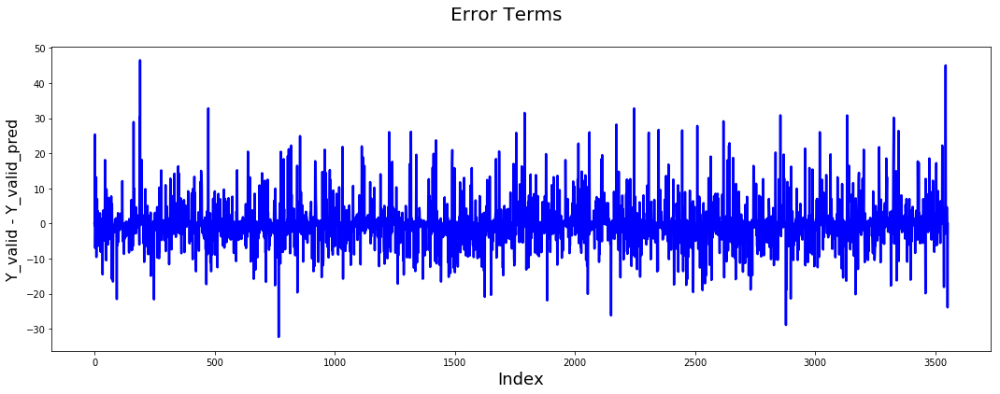

In [261]:
# Error terms
c = [i for i in range(len(Y_valid_pred))]
fig = plt.figure(figsize=(18,6))
plt.plot(c, Y_valid - Y_valid_pred, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('Y_valid - Y_valid_pred', fontsize=16)                # Y-label
plt.show()

Now we will plot both the actual and predicted values and compare the predictions obtained.

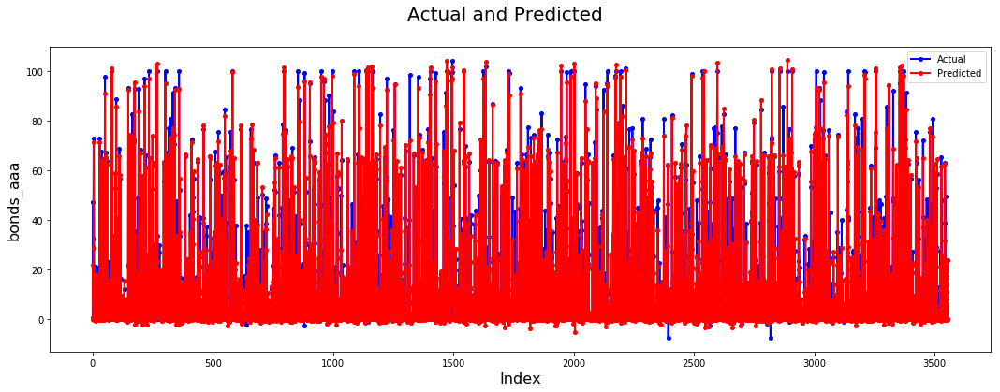

In [262]:
# Actual vs Predicted
c = [i for i in range(1,len(Y_valid)+1,1)]
fig = plt.figure(figsize=(18,6))
plt.plot(c, Y_valid, marker='o', markerfacecolor='blue', markersize=4, color='blue', linewidth=2, label='Actual')
plt.plot(c, Y_valid_pred, marker='o', markerfacecolor='red', markersize=4, color='red', linewidth=2, label='Predicted')
fig.suptitle('Actual and Predicted', fontsize=20)
plt.xlabel('Index', fontsize=16)
plt.ylabel('bonds_aaa', fontsize=16)
plt.legend(loc='best')

Bonds_aaa prediction looks good comparing with the actual values. Let's go ahead and predict the test data and prepare the final submission.  

### Predict with Final Test Data

In [263]:
# Predict with the test data
Y_final_pred = model.predict(X_test)

#Prepare the Final submission dataframe
result_df = pd.DataFrame({'serial number':test_SNO,'bonds_aaa':np.round(Y_final_pred,2)})
result_df.sample(10)

,serial number,bonds_aaa
3944,3945,23.780001
3141,3142,16.320000
2768,2769,14.570000
1615,1616,10.110000
1070,1071,7.520000
5643,5644,8.280000
6014,6015,13.360000
877,878,18.930000
1591,1592,44.220001
1875,1876,29.340000


### Prepare the Final submission file

In [264]:
#result_df.to_csv('Final_submission.csv', index=False)